# Time-Resolved Limited-Angle CT via Gaussian Splatting

**Core idea:** Represent a time-evolving 2D image slice using 3D Gaussian splatting as a latent representation. Each time-step is parameterised as the **base Gaussians + learnable deltas**, and all slices are optimised jointly using limited-angle CT measurements.

## Pipeline

$$\underbrace{\theta_0}_{\text{base Gaussians}} \xrightarrow{+\Delta_t} \underbrace{\theta_t}_{\text{slice } t} \xrightarrow{\text{rasterize}} \hat{I}_t \xrightarrow[\text{astra-torch}]{\text{forward project}} \hat{p}_t \xrightarrow{\text{MSE}(p_t^{\text{meas}})} \mathcal{L} \rightarrow \nabla_{\theta_0, \Delta_t}$$

**Key properties:**
- **Shared structure:** All slices share $\theta_0$ (base Gaussians), so the prior that slices are similar is built into the parameterisation
- **Learnable deltas:** $\Delta_t \in \mathbb{R}^{N \times 14}$ captures per-Gaussian changes across time
- **Differentiable:** Gradients flow from CT projection loss back through astra-torch → rasterised image → Gaussian parameters
- **Limited-angle:** Each slice only observes k contiguous angles — the shared base + delta structure regularises the reconstruction

## 1. Imports and Setup

In [108]:
try:
    import wandb
except ImportError:
    !pip install wandb
    !sh /myhome/chip-project/scripts/setup.sh
    !pip install ipywidgets
    !pip install --upgrade torch


In [109]:
import sys, math, time
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.amp import GradScaler, autocast
from tqdm import tqdm

import lovely_tensors as lt
lt.monkey_patch()

# ── Project paths ─────────────────────────────────────────────────────────
project_root = Path.cwd().parent
sys.path.insert(0, str(project_root))
sys.path.insert(0, '/myhome/astra-torch')

# ── gsplat_compress library ───────────────────────────────────────────────
import gsplat_compress as gc
from gsplat_compress import (
    GaussianParams, init_gaussians, ortho_camera, render,
    TrainConfig, FinetuneConfig, TrainResult,
    train_keyframe, finetune_frame,
    compute_deltas, reconstruct_from_delta, split_delta,
    psnr, ssim, mse,
    D_FULL, D_EFF, S_M, S_S, S_Q, S_R, S_O,
)

# ── Data loading ──────────────────────────────────────────────────────────
from inct.dataset_slices import ProjectionSliceDataset
from sdate.limited_angle_tomo import (
    LimitedAngleConfig, build_limited_angle_dataset, normalize_sinogram,
)

# ── Astra-torch for CT forward projection (using lamino with angle=0 for 2D) ──
from astra_torch.lamino import (
    build_lamino_projector,
    fbp_reconstruction_masked,
    gd_reconstruction_masked,
    sirt_reconstruction_masked,
)

# ── Laminography angle for standard 2D parallel-beam CT ───────────────────
LAMINO_ANGLE_DEG = 0.0

plt.rcParams['figure.figsize'] = (14, 5)
plt.rcParams['image.cmap'] = 'gray'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}  |  PyTorch {torch.__version__}")
if device.type == 'cuda':
    print(f"GPU: {torch.cuda.get_device_name()}")
print("✅ Imports ready (using astra_torch.lamino)")

Device: cuda  |  PyTorch 2.11.0+cu130
GPU: NVIDIA A100 80GB PCIe
✅ Imports ready (using astra_torch.lamino)


## 2. Configuration

All key hyperparameters are defined here so they can be tuned easily.

In [110]:
# ══════════════════════════════════════════════════════════════════════════
# CONFIGURATION — tune these
# ══════════════════════════════════════════════════════════════════════════

# ── Data ──────────────────────────────────────────────────────────────────
DATA_PATH = Path('/myhome/data/sdate/shared/compression_paper/file_1_extracted')
NUM_PROJECTIONS = 1501
TARGET_SIZE = (2560 // 2, 2160 // 2)  # Half resolution

# ── Limited-angle tomography ──────────────────────────────────────────────
N_SLICES = 20          # Number of time slices
K_ANGLES = 400         # Contiguous angles per slice

# ── Gaussian splatting ────────────────────────────────────────────────────
N_GAUSSIANS = 200_000   # Number of Gaussians for base representation
INIT_MODE = 'uniform'
INIT_SCALE_PX = 3.0
USE_FP16 = True

# ── Phase 1: Fit base Gaussians to reference image (first slice, full angle)
BASE_TRAIN_ITERS = 15000

# ── CT geometry ───────────────────────────────────────────────────────────
DET_SPACING_MM = 1.0
VOXEL_SIZE_MM = 1.0

print("Configuration set ✅")
print(f"  Slices:     {N_SLICES}")
print(f"  Angles/sl:  {K_ANGLES}")
print(f"  Gaussians:  {N_GAUSSIANS:,}")

Configuration set ✅
  Slices:     20
  Angles/sl:  400
  Gaussians:  200,000


## 3. Load Data and Build Limited-Angle Dataset

In [111]:
# ── Load full volume ──────────────────────────────────────────────────────
dataset = ProjectionSliceDataset(
    folder_path=DATA_PATH,
    num_projections=NUM_PROJECTIONS,
    target_size=TARGET_SIZE,
    normalize_values=True,
    verbose=True,
    cache_volume=True,
    use_attenuation=True,
)

volume = dataset.get_full_volume()  # (H, W, N_proj)
H_vol, W_vol, N_proj = volume.shape
print(f"\nVolume: ({H_vol}, {W_vol}, {N_proj})")

✅ Found parameters in JC_62d.log: {'num_darks': 10, 'num_flats': 100, 'num_projections': 1501}
📂 Loaded folder: file_1_extracted
   Total TIFF files: 1711
   Darks: 10, Flats: 100, Projections: 1501
   Image dimensions: 2560 x 2160
   Use attenuation: True


✅ Loaded cached attenuation data from .tomography_cache_atten.npz
   Range: [-0.1997, 1.7837]
ProjectionSliceDataset:
  Volume shape: (1080, 1280, 1501)
  Slice dimension: 2
  Slices per batch: 1
  Voxels per slice (dim=2): 1,382,400
Loading 1501 projections...
  Loaded 50/1501
  Loaded 100/1501
  Loaded 150/1501
  Loaded 200/1501
  Loaded 250/1501
  Loaded 300/1501
  Loaded 350/1501
  Loaded 400/1501
  Loaded 450/1501
  Loaded 500/1501
  Loaded 550/1501
  Loaded 600/1501
  Loaded 650/1501
  Loaded 700/1501
  Loaded 750/1501
  Loaded 800/1501
  Loaded 850/1501
  Loaded 900/1501
  Loaded 950/1501
  Loaded 1000/1501
  Loaded 1050/1501
  Loaded 1100/1501
  Loaded 1150/1501
  Loaded 1200/1501
  Loaded 1250/1501
  Loaded 1300/1501
  Loaded 1350/1501
  Loaded 1400/1501
  Loaded 1450/1501
  Loaded 1500/1501
Volume shape: (1080, 1280, 1501)
Total voxels: 2,074,982,400
Value range: [-0.1612, 1.7187]

Volume: (1080, 1280, 1501)


In [112]:
# ── Build limited-angle dataset ───────────────────────────────────────────
la_config = LimitedAngleConfig(
    n_slices=N_SLICES,
    k_angles=K_ANGLES,
    total_projections=N_proj,
    angular_range_deg=(0.0, 180.0),
    det_spacing_mm=DET_SPACING_MM,
    voxel_size_mm=VOXEL_SIZE_MM,
)

la_data = build_limited_angle_dataset(volume, la_config)
print(la_data.angle_coverage_summary())

Limited-angle dataset: 20 slices, k=400 angles/slice, total=1501 projections
 Slice   Height   Angle start   Angle end   #Angles
-------------------------------------------------------
     0        0          0.00°       47.85°       400
     1        1         47.97°       95.82°       400
     2        2         95.94°      143.78°       400
     3        3        143.90°       11.75°       400
     4        4         11.87°       59.72°       400
     5        5         59.84°      107.69°       400
     6        6        107.81°      155.66°       400
     7        7        155.78°       23.62°       400
     8        8         23.74°       71.59°       400
     9        9         71.71°      119.56°       400
    10       10        119.68°      167.53°       400
    11       11        167.65°       35.50°       400
    12       12         35.62°       83.46°       400
    13       13         83.58°      131.43°       400
    14       14        131.55°      179.40°       400
    1

## 4. Full-Angle Reference Reconstructions

Reconstruct each slice from all projections for ground-truth comparison.

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s, loss=8.857e-01, avg=8.857e-01, k=30, lr=5.0e-01, opt=ADAM]

[0.5] [5]


100%|██████████| 5/5 [00:21<00:00,  4.34s/it, loss=8.243e-05, avg=6.212e-05, k=1, lr=5.0e-01, opt=ADAM] 


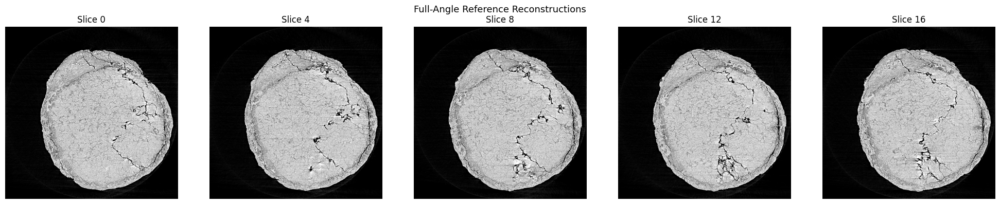

In [113]:

recon_3d = gd_reconstruction_masked(
        projs_vrc=la_data.full_sinograms.transpose(0, 1),
        angles_deg=la_data.all_angles_deg,
        lamino_angle_deg=LAMINO_ANGLE_DEG,
        vol_shape=(la_data.full_sinograms.shape[0], la_data.full_sinograms.shape[-1], la_data.full_sinograms.shape[-1], ),
        det_spacing_mm=DET_SPACING_MM,
        batch_size= 30,
        max_epochs = [5],
        lr = [0.5],
        vol_init = None,
        device=device,
        verbose=True
    )

full_recons = recon_3d.cpu()
# Visualise a few
n_show = min(5, N_SLICES)
fig, axes = plt.subplots(1, n_show, figsize=(4*n_show, 4))
for j in range(n_show):
    idx = j * (N_SLICES // n_show)
    img = full_recons[idx].numpy()
    vmin, vmax = np.percentile(img, [2, 98])
    axes[j].imshow(img, cmap='gray', vmin=vmin, vmax=vmax)
    axes[j].set_title(f'Slice {idx}')
    axes[j].axis('off')
plt.suptitle('Full-Angle Reference Reconstructions', fontsize=13)
plt.tight_layout(); plt.show()

In [114]:
# ── Full-angle reconstructions (reference) ────────────────────────────────
vol_shape = la_data.vol_shape           # (ny, nx) — square, e.g. (1280, 1280)
vol_shape_3d = (1, *vol_shape)          # (1, ny, nx) for lamino

# full_recons = []
# print(f"Full-angle FBP for {N_SLICES} slices …")
# print(f"  vol_shape_3d = {vol_shape_3d}  |  lamino_angle = {LAMINO_ANGLE_DEG}°")
# t0 = time.time()

# for i in range(N_SLICES):
#     sino = la_data.full_sinograms[i].to(device)     # (V, W)
#     sino_vrc = sino.unsqueeze(1)                      # (V, 1, W)
#     recon_3d = fbp_reconstruction_masked(
#         projs_vrc=sino_vrc,
#         angles_deg=la_data.all_angles_deg,
#         lamino_angle_deg=LAMINO_ANGLE_DEG,
#         vol_shape=vol_shape_3d,
#         det_spacing_mm=DET_SPACING_MM,
#         filter_type='hann',
#         device=device,
#     )
#     full_recons.append(recon_3d[0].cpu())             # (ny, nx)

# full_recons = torch.stack(full_recons, dim=0)
# print(f"✅ Done in {time.time()-t0:.1f}s — shape {full_recons.shape}")

# # Visualise a few
# n_show = min(5, N_SLICES)
# fig, axes = plt.subplots(1, n_show, figsize=(4*n_show, 4))
# for j in range(n_show):
#     idx = j * (N_SLICES // n_show)
#     img = full_recons[idx].numpy()
#     vmin, vmax = np.percentile(img, [2, 98])
#     axes[j].imshow(img, cmap='gray', vmin=vmin, vmax=vmax)
#     axes[j].set_title(f'Slice {idx}')
#     axes[j].axis('off')
# plt.suptitle('Full-Angle Reference Reconstructions', fontsize=13)
# plt.tight_layout(); plt.show()

## 5. Rasterise → Forward Project: Differentiable CT Pipeline

**Key idea for Phase 1:** Instead of fitting Gaussians directly to a reconstructed image, we train them through the full differentiable CT pipeline:

$$\theta_0 \xrightarrow{\text{rasterize}} \hat{I}_0 \xrightarrow[\text{astra-torch}]{\text{forward project}} \hat{p}_0 \xrightarrow{\text{MSE}(p_0^{\text{meas}})} \mathcal{L} \rightarrow \nabla_{\theta_0}$$

This ensures that the base Gaussians are optimised to produce images whose **projections** match the measured sinogram — the Gaussians never see a reconstructed image during training.

### Helper functions
- `rasterise_and_project`: Gaussians → 2D image → CT sinogram (fully differentiable)
- `apply_deltas`: $\theta_t = \theta_0 + \Delta_t$ for time-resolved reconstruction

In [115]:
def rasterise_and_project(
    params: GaussianParams,
    viewmat: torch.Tensor,
    K_cam: torch.Tensor,
    W_img: int,
    H_img: int,
    projector_fn,
    img_min: float = 0.0,
    img_max: float = 1.0,
) -> torch.Tensor:
    """Rasterise Gaussians → 2D image → CT forward projection.
    
    Parameters
    ----------
    params : GaussianParams
        Gaussian parameters (base + delta already applied).
    viewmat, K_cam : camera matrices
    W_img, H_img : image dimensions for rasterisation
    projector_fn : callable
        astra-torch lamino projector: input (B,1,nz,ny,nx), output (B,V,R,C)
        For 2D, nz=1 and R=1.
    img_min, img_max : float
        Unnormalisation range for the rasterised image.
        
    Returns
    -------
    sinogram : (V, C) projected sinogram
    rasterised_image : (H, W) rasterised image (for visualisation)
    """
    # Rasterise Gaussians to 2D image
    rendered, _, _ = render(
        params.means, params.log_scales, params.quats,
        params.rgbs, params.opacities, viewmat, K_cam, W_img, H_img,
    )
    # rendered: (H, W, 3), take first channel for grayscale
    image_2d = rendered[:, :, 0]  # (H, W) in [0, 1]
    
    # Clamp to valid range
    image_2d = torch.clamp(image_2d, 0.0, 1.0)
    
    # Unnormalise to original intensity range for CT projection
    image_2d_unnorm = image_2d * (img_max - img_min) + img_min
    
    # Forward project via lamino: (B, 1, nz, ny, nx) → (B, V, R, C)
    # For 2D: nz=1, R=1
    vol_input = image_2d_unnorm.unsqueeze(0).unsqueeze(0).unsqueeze(0)  # (1, 1, 1, H, W)
    sinogram_batch = projector_fn(vol_input)  # (1, V, 1, W)
    sinogram = sinogram_batch[0, :, 0, :]     # (V, W)
    
    return sinogram, image_2d


def apply_cumulative_deltas(
    base_params: GaussianParams,
    deltas_list: list,
    t: int,
) -> GaussianParams:
    """Apply cumulative (incremental) deltas to base Gaussian parameters.

    Frame t is computed as:
        frame_t = base + delta_0 + delta_1 + ... + delta_t

    Each delta_i represents the incremental change *from frame i-1 to frame i*,
    so the scheme is truly incremental rather than all-relative-to-base.

    Parameters
    ----------
    base_params : GaussianParams
        Frozen base parameters (no grad).
    deltas_list : list of torch.Tensor, each shape (N, 14)
        Learnable incremental steps.  deltas_list[i] is the step at frame i.
    t : int
        Frame index.  Accumulates deltas_list[0 .. t] inclusive.

    Returns
    -------
    GaussianParams with base + sum(deltas_list[0..t]) applied.
    """
    # Accumulate incremental steps: sum delta_0 + ... + delta_t
    cum_delta = sum(deltas_list[: t + 1])   # (N, 14)

    new_means      = base_params.means      + cum_delta[:, S_M]   # (N, 3)
    new_log_scales = base_params.log_scales + cum_delta[:, S_S]   # (N, 3)
    new_quats      = base_params.quats      + cum_delta[:, S_Q]   # (N, 4)
    new_rgbs       = base_params.rgbs       + cum_delta[:, S_R]   # (N, 3)
    new_opacities  = base_params.opacities  + cum_delta[:, S_O]   # (N,)

    return GaussianParams(
        means=new_means,
        log_scales=new_log_scales,
        quats=new_quats,
        rgbs=new_rgbs,
        opacities=new_opacities,
    )

# ══════════════════════════════════════════════════════════════════════════
# Adaptive Densification (projection-based)
# ══════════════════════════════════════════════════════════════════════════
# Same intrinsic criteria as image-space densification (opacity threshold,
# scale threshold) but with delta-tensor resizing support for Phase 2.
# ══════════════════════════════════════════════════════════════════════════

import math as _math

def densify_gaussians(
    params: GaussianParams,
    prune_opacity_thresh: float = 0.005,
    split_scale_thresh: float = 10.0,
):
    """Prune low-opacity and split over-large Gaussians.

    Returns
    -------
    new_params : GaussianParams  (requires_grad=True)
    n_pruned   : int
    n_split    : int
    keep_mask  : BoolTensor  (size = original N, True → kept)
    split_mask : BoolTensor  (size = post-prune N, True → will be split)
    """
    n_before = params.n_gaussians

    with torch.no_grad():
        # ── Prune: remove low-opacity Gaussians ──────────────────────
        opac_vals = torch.sigmoid(params.opacities)
        keep_mask = opac_vals > prune_opacity_thresh
        n_pruned = n_before - keep_mask.sum().item()

        means      = params.means.data[keep_mask].clone()
        log_scales = params.log_scales.data[keep_mask].clone()
        quats      = params.quats.data[keep_mask].clone()
        rgbs       = params.rgbs.data[keep_mask].clone()
        opacities  = params.opacities.data[keep_mask].clone()

        # ── Split: subdivide over-large Gaussians ────────────────────
        scales_now = torch.exp(log_scales)
        split_mask = scales_now[:, :2].max(dim=1).values > split_scale_thresh
        n_split = split_mask.sum().item()

        if n_split > 0:
            p_means  = means[split_mask]
            p_scales = log_scales[split_mask]
            p_quats  = quats[split_mask]
            p_rgbs   = rgbs[split_mask]
            p_opac   = opacities[split_mask]

            offset = 0.5 * torch.exp(p_scales[:, :2])
            off3d = torch.zeros_like(p_means)
            off3d[:, :2] = offset

            c1_means = p_means + off3d
            c2_means = p_means - off3d
            c_scales = p_scales - _math.log(2.0)

            keep = ~split_mask
            means      = torch.cat([means[keep],      c1_means,       c2_means],       0)
            log_scales = torch.cat([log_scales[keep],  c_scales,       c_scales.clone()], 0)
            quats      = torch.cat([quats[keep],       p_quats,        p_quats.clone()],  0)
            rgbs       = torch.cat([rgbs[keep],        p_rgbs,         p_rgbs.clone()],   0)
            opacities  = torch.cat([opacities[keep],   p_opac,         p_opac.clone()],   0)

    new_params = GaussianParams(means, log_scales, quats, rgbs, opacities)
    new_params.require_grad_()
    return new_params, n_pruned, n_split, keep_mask, split_mask


def densify_with_deltas(
    params: GaussianParams,
    deltas_list: list,
    prune_opacity_thresh: float = 0.005,
    split_scale_thresh: float = 10.0,
):
    """Densify base Gaussians and resize all delta tensors to match.

    Pruned rows → removed from deltas.
    Split rows  → duplicated in deltas for both children.
    """
    new_params, n_pruned, n_split, keep_mask, split_mask = densify_gaussians(
        params, prune_opacity_thresh, split_scale_thresh
    )

    new_deltas = []
    with torch.no_grad():
        for delta in deltas_list:
            d = delta.data[keep_mask].clone()
            if n_split > 0:
                d_keep  = d[~split_mask]
                d_split = d[split_mask]
                d = torch.cat([d_keep, d_split, d_split.clone()], 0)
            new_deltas.append(d.requires_grad_(True))

    return new_params, new_deltas, n_pruned, n_split


def build_base_optimizer(params, lr_dict=None):
    """Build Adam optimizer for base Gaussian parameters."""
    if lr_dict is None:
        lr_dict = {
            'means': 1e-3, 'log_scales': 5e-3, 'quats': 1e-3,
            'rgbs': 1e-2, 'opacities': 5e-2,
        }
    return optim.Adam([
        {"params": [params.means],      "lr": lr_dict['means']},
        {"params": [params.log_scales], "lr": lr_dict['log_scales']},
        {"params": [params.quats],      "lr": lr_dict['quats']},
        {"params": [params.rgbs],       "lr": lr_dict['rgbs']},
        {"params": [params.opacities],  "lr": lr_dict['opacities']},
    ], betas=(0.9, 0.999))


def build_joint_optimizer(base_params_opt, deltas_list, lr_base, lr_delta):
    """Build Adam optimizer for joint training (base params + deltas)."""
    param_groups = [
        {"params": base_params_opt.tensors(), "lr": lr_base},
        {"params": deltas_list, "lr": lr_delta},
    ]
    return optim.Adam(param_groups)


print("✅ rasterise_and_project, apply_cumulative_deltas, densification helpers defined")

✅ rasterise_and_project, apply_cumulative_deltas, densification helpers defined


In [116]:
# ══════════════════════════════════════════════════════════════════════════
# Phase 1 Setup: Fit base Gaussians via CT projection loss
# Pipeline: Gaussians → rasterise → forward project → MSE(sinogram) → backprop
# ══════════════════════════════════════════════════════════════════════════

# ── Reference image for initialisation + normalisation range ──────────────
# FBP reference is used ONLY for Gaussian position seeding and normalisation;
# training is purely through projection measurements.
ref_image_0 = full_recons[0]  # (ny, nx)
ref_min, ref_max = ref_image_0.min(), ref_image_0.max()
ref_image_0_norm = (ref_image_0 - ref_min) / (ref_max - ref_min + 1e-8)

H_img, W_img = ref_image_0_norm.shape
print(f"Image dimensions: ({H_img}, {W_img})")

# ── Orthographic camera ──────────────────────────────────────────────────
K_cam, viewmat = ortho_camera(device)

# ── Initialise Gaussians (positions seeded from FBP, training via projections)
params_base = init_gaussians(
    ref_image_0_norm, N_GAUSSIANS, device,
    mode=INIT_MODE, init_scale_px=INIT_SCALE_PX,
    init_opacity=0.3, seed=42,
)
params_base = params_base.require_grad_()
print(f"Initialised {params_base.n_gaussians:,} Gaussians (requires_grad=True)")

# ── Build full-angle projector for slice 0 ────────────────────────────────
projector_full = build_lamino_projector(
    vol_shape=vol_shape_3d,
    det_shape=(1, la_data.W),
    angles_deg=la_data.all_angles_deg,
    lamino_angle_deg=LAMINO_ANGLE_DEG,
    voxel_size_mm=VOXEL_SIZE_MM,
    det_spacing_mm=DET_SPACING_MM,
    device=device,
)

# ── Target: measured full sinogram for slice 0 ───────────────────────────
sino_target = la_data.full_sinograms[0].to(device)  # (V, W)
print(f"Target sinogram shape: {sino_target.shape}")
print(f"\n✅ Phase 1 setup complete — projection-based fitting ({BASE_TRAIN_ITERS} iterations)")

Image dimensions: (1280, 1280)
Initialised 200,704 Gaussians (requires_grad=True)
Target sinogram shape: torch.Size([1501, 1280])

✅ Phase 1 setup complete — projection-based fitting (15000 iterations)


In [117]:
BASE_TRAIN_ITERS = 500

# ── Phase 1 Densification config ─────────────────────────────────────────
DENSIFY_FROM_P1     = 200     # Start densifying after this many steps
DENSIFY_INTERVAL_P1 = 200     # Densify every N steps
DENSIFY_UNTIL_P1    = 10_000  # Stop densifying after this step
PRUNE_OPACITY_THRESH_P1 = 0.005
SPLIT_SCALE_THRESH_P1   = 10.0

# ── Per-parameter optimiser ───────────────────────────────────────────────
optimizer_base = build_base_optimizer(params_base)
print(f"Phase 1 config: {BASE_TRAIN_ITERS} iters, densify every {DENSIFY_INTERVAL_P1} "
      f"steps from {DENSIFY_FROM_P1} to {DENSIFY_UNTIL_P1}")

Phase 1 config: 500 iters, densify every 200 steps from 200 to 10000


In [118]:
# ══════════════════════════════════════════════════════════════════════════
# Phase 1 Training: Gaussians → render → forward project → sinogram loss
#   + adaptive densification (prune low-opacity, split over-large)
# ══════════════════════════════════════════════════════════════════════════

loss_history_phase1 = []
eval_steps_phase1 = []
psnr_history_phase1 = []
densify_steps_phase1 = []

LOG_INTERVAL = 50

print(f"Phase 1: {BASE_TRAIN_ITERS} iterations — projection-based Gaussian fitting")
print(f"  Densification: every {DENSIFY_INTERVAL_P1} steps "
      f"from {DENSIFY_FROM_P1} to {min(DENSIFY_UNTIL_P1, BASE_TRAIN_ITERS)}")
print("=" * 70)

t_start = time.time()
pbar = tqdm(range(BASE_TRAIN_ITERS), desc="Phase 1", unit="iter")

for step in pbar:
    optimizer_base.zero_grad(set_to_none=True)
    
    # ── Rasterise → forward project ───────────────────────────────
    sino_pred, img_raster = rasterise_and_project(
        params_base, viewmat, K_cam, W_img, H_img,
        projector_full,
        img_min=float(ref_min), img_max=float(ref_max),
    )
    
    # ── Projection loss ───────────────────────────────────────────
    loss = F.mse_loss(sino_pred, sino_target)
    
    # ── Backward + step ───────────────────────────────────────────
    loss.backward()
    optimizer_base.step()
    
    loss_history_phase1.append(loss.item())
    
    postfix = {"proj_loss": f"{loss.item():.6f}"}
    
    # ── Adaptive densification ────────────────────────────────────
    if (DENSIFY_FROM_P1 <= step < DENSIFY_UNTIL_P1
            and step % DENSIFY_INTERVAL_P1 == 0
            and step > 0):
        params_base, n_pruned, n_split, _, _ = densify_gaussians(
            params_base, PRUNE_OPACITY_THRESH_P1, SPLIT_SCALE_THRESH_P1,
        )
        # Halve LR in second half of training
        lr_mult = 0.5 if step > BASE_TRAIN_ITERS // 2 else 1.0
        lr_dict = {
            'means': 1e-3 * lr_mult, 'log_scales': 5e-3 * lr_mult,
            'quats': 1e-3 * lr_mult, 'rgbs': 1e-2 * lr_mult,
            'opacities': 5e-2 * lr_mult,
        }
        optimizer_base = build_base_optimizer(params_base, lr_dict)
        densify_steps_phase1.append(step)
        pbar.write(f"  ↳ [densify @ {step}] pruned={n_pruned}  "
                   f"split={n_split}  N={params_base.n_gaussians:,}")
    
    # ── Logging via tqdm ──────────────────────────────────────────
    if (step + 1) % LOG_INTERVAL == 0 or step == 0:
        with torch.no_grad():
            rendered, _, _ = render(
                params_base.means, params_base.log_scales, params_base.quats,
                params_base.rgbs, params_base.opacities, viewmat, K_cam, W_img, H_img,
            )
            img_np = np.clip(rendered[:, :, 0].cpu().numpy(), 0, 1)
            ref_np = ref_image_0_norm.numpy()
            p = psnr(img_np, ref_np)
        
        eval_steps_phase1.append(step + 1)
        psnr_history_phase1.append(p)
        
        elapsed = time.time() - t_start
        postfix["img_psnr"] = f"{p:.2f} dB"
        postfix["elapsed"] = f"{elapsed:.1f}s"
        postfix["N"] = f"{params_base.n_gaussians:,}"
    elif psnr_history_phase1:
        postfix["img_psnr"] = f"{psnr_history_phase1[-1]:.2f} dB"
    
    pbar.set_postfix(postfix)

elapsed_phase1 = time.time() - t_start
print(f"\n✅ Phase 1 done in {elapsed_phase1:.1f}s")
print(f"  Final projection loss: {loss_history_phase1[-1]:.6f}")
print(f"  Final image PSNR (vs FBP ref): {psnr_history_phase1[-1]:.2f} dB")
print(f"  Gaussians: {params_base.n_gaussians:,} "
      f"(densified {len(densify_steps_phase1)} times)")

Phase 1: 500 iterations — projection-based Gaussian fitting
  Densification: every 200 steps from 200 to 500


Phase 1:  40%|████      | 202/500 [00:15<00:23, 12.80iter/s, proj_loss=0.000188, img_psnr=26.87 dB]                          

  ↳ [densify @ 200] pruned=0  split=0  N=200,704


Phase 1:  80%|████████  | 402/500 [00:30<00:08, 12.14iter/s, proj_loss=0.000132, img_psnr=28.00 dB]                          

  ↳ [densify @ 400] pruned=0  split=0  N=200,704


Phase 1: 100%|██████████| 500/500 [00:38<00:00, 12.98iter/s, proj_loss=0.000126, img_psnr=28.20 dB, elapsed=38.5s, N=200,704]


✅ Phase 1 done in 38.5s
  Final projection loss: 0.000126
  Final image PSNR (vs FBP ref): 28.20 dB
  Gaussians: 200,704 (densified 2 times)


## 6. Phase 1 Results — Projection-Trained Base Gaussians

Evaluate the base Gaussians trained via the differentiable CT pipeline:
- **Sinogram fit**: compare predicted vs measured projections
- **Image quality**: compare rasterised Gaussians to full-angle FBP reference
- **Training dynamics**: loss curve and PSNR evolution

Note: the Gaussians were *never shown* the reconstructed image — they learned solely from projection measurements.

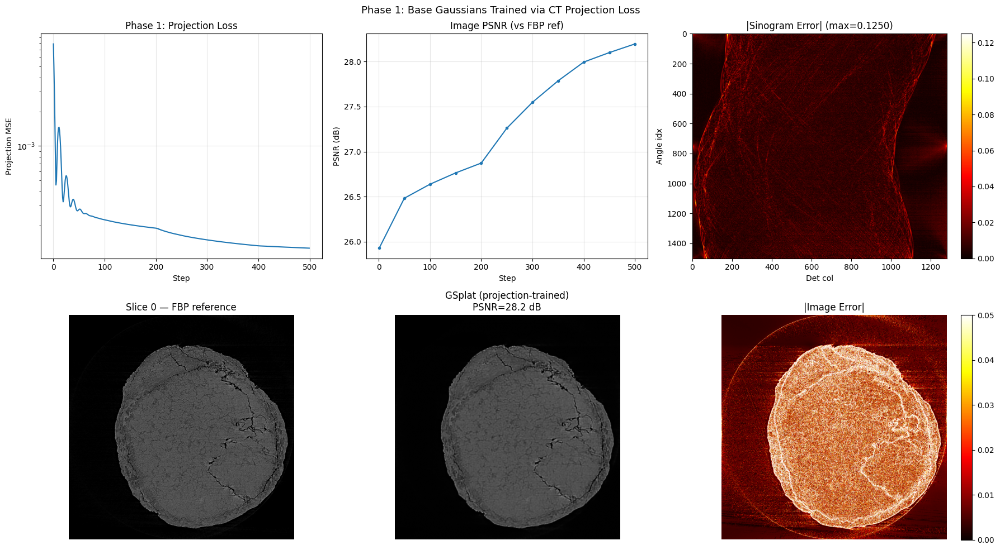

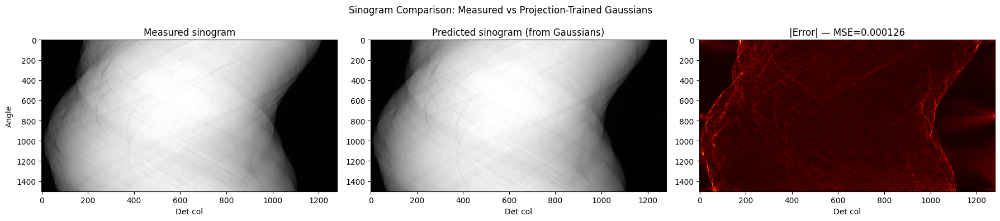

In [119]:
# ── Phase 1 visualisation ─────────────────────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Row 1: Training curves + sinogram error
axes[0, 0].semilogy(loss_history_phase1)
axes[0, 0].set_xlabel('Step'); axes[0, 0].set_ylabel('Projection MSE')
axes[0, 0].set_title('Phase 1: Projection Loss'); axes[0, 0].grid(True, alpha=0.3)

axes[0, 1].plot(eval_steps_phase1, psnr_history_phase1, 'o-', markersize=3)
axes[0, 1].set_xlabel('Step'); axes[0, 1].set_ylabel('PSNR (dB)')
axes[0, 1].set_title('Image PSNR (vs FBP ref)'); axes[0, 1].grid(True, alpha=0.3)

with torch.no_grad():
    sino_final, img_final = rasterise_and_project(
        params_base, viewmat, K_cam, W_img, H_img,
        projector_full,
        img_min=float(ref_min), img_max=float(ref_max),
    )
sino_err = (sino_final - sino_target).abs().cpu().numpy()
im0 = axes[0, 2].imshow(sino_err, aspect='auto', cmap='hot')
axes[0, 2].set_title(f'|Sinogram Error| (max={sino_err.max():.4f})')
axes[0, 2].set_xlabel('Det col'); axes[0, 2].set_ylabel('Angle idx')
plt.colorbar(im0, ax=axes[0, 2], fraction=0.046)

# Row 2: Image comparison
with torch.no_grad():
    rendered, _, _ = render(
        params_base.means, params_base.log_scales, params_base.quats,
        params_base.rgbs, params_base.opacities, viewmat, K_cam, W_img, H_img,
    )
base_np = np.clip(rendered[:, :, 0].cpu().numpy(), 0, 1)
target_np = ref_image_0_norm.numpy()

axes[1, 0].imshow(target_np, cmap='gray', vmin=0, vmax=1)
axes[1, 0].set_title('Slice 0 — FBP reference'); axes[1, 0].axis('off')

axes[1, 1].imshow(base_np, cmap='gray', vmin=0, vmax=1)
axes[1, 1].set_title(f'GSplat (projection-trained)\nPSNR={psnr_history_phase1[-1]:.1f} dB')
axes[1, 1].axis('off')

im1 = axes[1, 2].imshow(np.abs(base_np - target_np), cmap='hot', vmin=0, vmax=0.05)
axes[1, 2].set_title('|Image Error|'); axes[1, 2].axis('off')
plt.colorbar(im1, ax=axes[1, 2], fraction=0.046)

plt.suptitle('Phase 1: Base Gaussians Trained via CT Projection Loss', fontsize=13)
plt.tight_layout(); plt.show()

# ── Sinogram comparison ──────────────────────────────────────────────────
fig2, axes2 = plt.subplots(1, 3, figsize=(18, 4))
sino_meas_np = sino_target.cpu().numpy()
sino_pred_np = sino_final.cpu().numpy()
vmin_s, vmax_s = np.percentile(sino_meas_np, [2, 98])

axes2[0].imshow(sino_meas_np, aspect='auto', cmap='gray', vmin=vmin_s, vmax=vmax_s)
axes2[0].set_title('Measured sinogram'); axes2[0].set_xlabel('Det col'); axes2[0].set_ylabel('Angle')

axes2[1].imshow(sino_pred_np, aspect='auto', cmap='gray', vmin=vmin_s, vmax=vmax_s)
axes2[1].set_title('Predicted sinogram (from Gaussians)')
axes2[1].set_xlabel('Det col')

sino_mse_val = np.mean((sino_pred_np - sino_meas_np) ** 2)
axes2[2].imshow(sino_err, aspect='auto', cmap='hot')
axes2[2].set_title(f'|Error| — MSE={sino_mse_val:.6f}')
axes2[2].set_xlabel('Det col')

plt.suptitle('Sinogram Comparison: Measured vs Projection-Trained Gaussians', fontsize=12)
plt.tight_layout(); plt.show()

SINOGRAM FIT QUALITY

Intensity statistics:
  Measured:  mean=0.8053, std=0.4884, range=[-0.0632, 1.4524]
  Predicted: mean=0.8054, std=0.4880, range=[0.0102, 1.4264]

Error metrics:
  MSE: 0.00012642
  MAE: 0.008420
  Relative L2 error: 1.1939%

  Optimal scale factor (measured/predicted): 0.999994
  ✅ Scale factor ≈ 1.0 — good intensity calibration


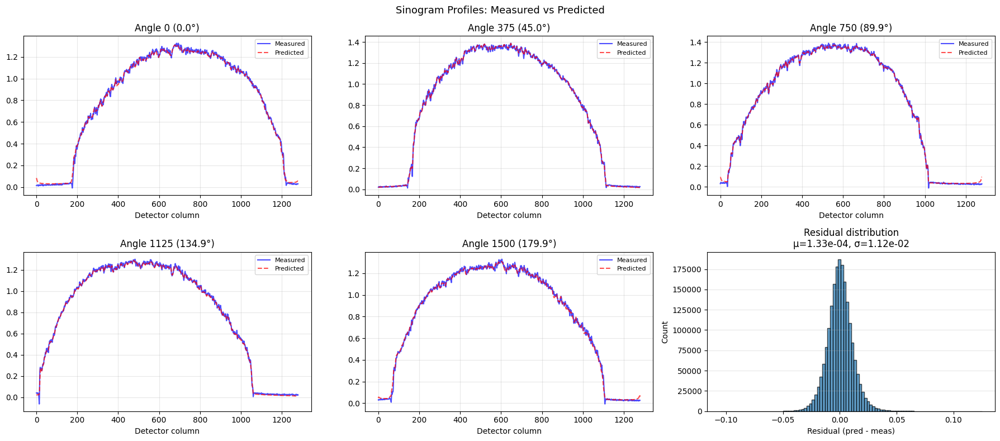

In [120]:
# ── Detailed sinogram fit diagnostics ────────────────────────────────────
print("=" * 70)
print("SINOGRAM FIT QUALITY")
print("=" * 70)

with torch.no_grad():
    # Statistics
    print(f"\nIntensity statistics:")
    print(f"  Measured:  mean={sino_target.mean():.4f}, std={sino_target.std():.4f}, "
          f"range=[{sino_target.min():.4f}, {sino_target.max():.4f}]")
    print(f"  Predicted: mean={sino_final.mean():.4f}, std={sino_final.std():.4f}, "
          f"range=[{sino_final.min():.4f}, {sino_final.max():.4f}]")
    
    # Error metrics
    mse = F.mse_loss(sino_final, sino_target).item()
    mae = (sino_final - sino_target).abs().mean().item()
    rel_err = torch.norm(sino_final - sino_target) / torch.norm(sino_target) * 100
    
    print(f"\nError metrics:")
    print(f"  MSE: {mse:.8f}")
    print(f"  MAE: {mae:.6f}")
    print(f"  Relative L2 error: {rel_err:.4f}%")
    
    # Check for scale mismatch
    scale_check = (sino_target * sino_final).sum() / (sino_final * sino_final).sum()
    print(f"\n  Optimal scale factor (measured/predicted): {scale_check:.6f}")
    if abs(scale_check - 1.0) > 0.01:
        print(f"  ⚠️  Scale factor deviates from 1.0 — intensity calibration may be off!")
    else:
        print(f"  ✅ Scale factor ≈ 1.0 — good intensity calibration")

# Profile comparison: sample a few angles
fig, axes = plt.subplots(2, 3, figsize=(18, 8))
sample_angles = [0, len(sino_target) // 4, len(sino_target) // 2, 3 * len(sino_target) // 4, len(sino_target) - 1]

for i, angle_idx in enumerate(sample_angles[:3]):
    axes[0, i].plot(sino_meas_np[angle_idx], 'b-', alpha=0.7, label='Measured', linewidth=1.5)
    axes[0, i].plot(sino_pred_np[angle_idx], 'r--', alpha=0.7, label='Predicted', linewidth=1.5)
    axes[0, i].set_title(f'Angle {angle_idx} ({la_data.all_angles_deg[angle_idx]:.1f}°)')
    axes[0, i].set_xlabel('Detector column')
    axes[0, i].legend(fontsize=8)
    axes[0, i].grid(alpha=0.3)

for i, angle_idx in enumerate(sample_angles[3:]):
    axes[1, i].plot(sino_meas_np[angle_idx], 'b-', alpha=0.7, label='Measured', linewidth=1.5)
    axes[1, i].plot(sino_pred_np[angle_idx], 'r--', alpha=0.7, label='Predicted', linewidth=1.5)
    axes[1, i].set_title(f'Angle {angle_idx} ({la_data.all_angles_deg[angle_idx]:.1f}°)')
    axes[1, i].set_xlabel('Detector column')
    axes[1, i].legend(fontsize=8)
    axes[1, i].grid(alpha=0.3)

# Residual histogram
residuals = (sino_pred_np - sino_meas_np).flatten()
axes[1, 2].hist(residuals, bins=100, alpha=0.7, edgecolor='black')
axes[1, 2].set_xlabel('Residual (pred - meas)')
axes[1, 2].set_ylabel('Count')
axes[1, 2].set_title(f'Residual distribution\nμ={residuals.mean():.2e}, σ={residuals.std():.2e}')
axes[1, 2].grid(alpha=0.3, axis='y')

plt.suptitle('Sinogram Profiles: Measured vs Predicted', fontsize=13)
plt.tight_layout(); plt.show()

## 7. Quick Sanity Check: Forward-Project the Base Fit

Verify that rasterising the base Gaussians and forward-projecting them produces
a sinogram consistent with the measured data for slice 0.

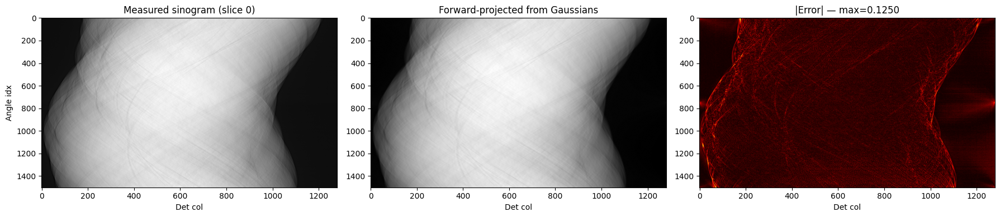

Sinogram MSE (base Gaussians vs measured): 0.000126


In [121]:
# ── Build projector for slice 0 (all angles) ──────────────────────────────
projector_all = build_lamino_projector(
    vol_shape=vol_shape_3d,              # (1, ny, nx)
    det_shape=(1, la_data.W),             # (1, det_cols)
    angles_deg=la_data.all_angles_deg,
    lamino_angle_deg=LAMINO_ANGLE_DEG,
    voxel_size_mm=VOXEL_SIZE_MM,
    det_spacing_mm=DET_SPACING_MM,
    device=device,
)

# Forward project the base Gaussian rasterisation
with torch.no_grad():
    sino_pred, img_raster = rasterise_and_project(
        params_base, viewmat, K_cam, W_img, H_img,
        projector_all,
        img_min=float(ref_min), img_max=float(ref_max),
    )

# Compare with measured sinogram
sino_meas = la_data.full_sinograms[0].to(device)

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
axes[0].imshow(sino_meas.cpu().numpy(), aspect='auto', cmap='gray')
axes[0].set_title('Measured sinogram (slice 0)'); axes[0].set_xlabel('Det col'); axes[0].set_ylabel('Angle idx')
axes[1].imshow(sino_pred.cpu().numpy(), aspect='auto', cmap='gray')
axes[1].set_title('Forward-projected from Gaussians')
axes[1].set_xlabel('Det col')
err_sino = (sino_pred - sino_meas).abs().cpu().numpy()
axes[2].imshow(err_sino, aspect='auto', cmap='hot')
axes[2].set_title(f'|Error| — max={err_sino.max():.4f}')
axes[2].set_xlabel('Det col')
plt.tight_layout(); plt.show()

sino_mse = torch.mean((sino_pred - sino_meas) ** 2).item()
print(f"Sinogram MSE (base Gaussians vs measured): {sino_mse:.6f}")

## 8. Phase 2 — Joint Optimisation with Deltas

**Architecture:**
- `params_base` ($\theta_0$): learnable base Gaussian parameters
- `deltas[t]` ($\Delta_t$): one `(N, 14)` tensor per time slice
- For slice $t$: $\theta_t = \theta_0 + \Delta_t$
- $\Delta_0 = 0$ (first slice is the base — can be enforced or regularised)

**Per-epoch:**
1. Iterate over slices $t = 0, \ldots, T-1$
2. Apply delta: $\theta_t = \theta_0 + \Delta_t$
3. Rasterise $\theta_t$ → image $\hat{I}_t$
4. Forward project $\hat{I}_t$ using the angles available for slice $t$
5. Compute loss vs measured sinogram
6. Accumulate gradients, step optimizer

**Regularisation:**
- $\|\Delta_t\|_2^2$ penalty to keep deltas small
- Optional: temporal smoothness $\|\Delta_t - \Delta_{t-1}\|_2^2$

In [122]:
# ── Build per-slice astra-torch lamino projectors ─────────────────────────
# Each slice has its own set of angles → its own projector
# For 2D: vol_shape_3d=(1, ny, nx), det_shape=(1, W), lamino_angle_deg=0
projectors = []
for t in range(N_SLICES):
    proj_fn = build_lamino_projector(
        vol_shape=vol_shape_3d,            # (1, ny, nx)
        det_shape=(1, la_data.W),           # (1, det_cols)
        angles_deg=la_data.slice_angles_deg[t],
        lamino_angle_deg=LAMINO_ANGLE_DEG,
        voxel_size_mm=VOXEL_SIZE_MM,
        det_spacing_mm=DET_SPACING_MM,
        device=device,
    )
    projectors.append(proj_fn)

print(f"✅ Built {N_SLICES} per-slice lamino projectors (angle={LAMINO_ANGLE_DEG}°)")

✅ Built 20 per-slice lamino projectors (angle=0.0°)


In [123]:
params_base = init_gaussians(
    ref_image_0_norm, N_GAUSSIANS, device,
    mode=INIT_MODE, init_scale_px=INIT_SCALE_PX,
    init_opacity=0.3, seed=42,
)

In [124]:
# ── Initialise learnable parameters ────────────────────────────────────────
# 1. base_params_opt: clone of the trained base Gaussians, with gradients enabled
base_params_opt = params_base.detach_clone().require_grad_()
N = base_params_opt.n_gaussians
print(f"Base Gaussians: {N:,} (requires_grad=True)")

# 2. deltas[t]: one (N, D_FULL) tensor per time-slice
#    Initialised to zero → slice 0 starts identical to base
deltas = [
    torch.zeros(N, D_FULL, device=device, requires_grad=True)
    for _ in range(N_SLICES)
]
print(f"Deltas: {N_SLICES} × ({N}, {D_FULL}) tensors")

# 3. slice_norms: (min, max) per slice for unnormalising rasterised images
#    back to the original intensity range before CT forward projection
slice_norms = []
for t in range(N_SLICES):
    ref_t = full_recons[t]
    smin, smax = float(ref_t.min()), float(ref_t.max())
    slice_norms.append((smin, smax))
print(f"Slice normalisation ranges computed ({N_SLICES} slices)")
print(f"  Example slice 0: [{slice_norms[0][0]:.2f}, {slice_norms[0][1]:.2f}]")

Base Gaussians: 200,704 (requires_grad=True)
Deltas: 20 × (200704, 14) tensors
Slice normalisation ranges computed (20 slices)
  Example slice 0: [0.00, 0.00]


In [125]:
# ── Joint CT-guided optimisation ─────────────────────────────────
JOINT_EPOCHS = 800       # Outer epochs
JOINT_LR_BASE = 5e-3    # Learning rate for base Gaussian parameters
JOINT_LR_DELTA = 5e-3   # Learning rate for delta parameters
JOINT_BATCH_ANGLES = 50  # Mini-batch of angles per gradient step
CLAMP_MIN = 0.0         # Non-negativity constraint on rasterised image

# ── Phase 2 Densification config ─────────────────────────────────────────
DENSIFY_FROM_P2     = 50      # Start densifying after this many epochs
DENSIFY_INTERVAL_P2 = 100     # Densify every N epochs
DENSIFY_UNTIL_P2    = 600     # Stop densifying after this epoch
PRUNE_OPACITY_THRESH_P2 = 0.005
SPLIT_SCALE_THRESH_P2   = 10.0

# ── Optimiser setup ───────────────────────────────────────────────────────
optimizer = build_joint_optimizer(base_params_opt, deltas, JOINT_LR_BASE, JOINT_LR_DELTA)

# ── Regularisation weights ────────────────────────────────────────────────
LAMBDA_DELTA_L2 = 1e-5      # L2 penalty on delta magnitudes
LAMBDA_TEMPORAL = 1e-5       # Temporal smoothness penalty
LAMBDA_ZERO_DELTA0 = 1e-6   # Penalty to keep delta_0 near zero

print(f"Regularisation: λ_delta={LAMBDA_DELTA_L2}, λ_temporal={LAMBDA_TEMPORAL}, λ_zero_d0={LAMBDA_ZERO_DELTA0}")
print(f"Densification: every {DENSIFY_INTERVAL_P2} epochs from {DENSIFY_FROM_P2} to {DENSIFY_UNTIL_P2}")

Regularisation: λ_delta=1e-05, λ_temporal=1e-05, λ_zero_d0=1e-06
Densification: every 100 epochs from 50 to 600


In [126]:
# ══════════════════════════════════════════════════════════════════════════
# Training loop  (with adaptive densification)
# ══════════════════════════════════════════════════════════════════════════

loss_history = []
per_slice_psnr_history = {t: [] for t in range(N_SLICES)}
densify_epochs_phase2 = []

print(f"Starting joint optimisation: {JOINT_EPOCHS} epochs × {N_SLICES} slices")
print(f"  Densification: every {DENSIFY_INTERVAL_P2} epochs "
      f"from {DENSIFY_FROM_P2} to {DENSIFY_UNTIL_P2}")
print("=" * 70)

t_start = time.time()

for epoch in range(JOINT_EPOCHS):
    epoch_loss = 0.0
    epoch_data_loss = 0.0
    epoch_reg_loss = 0.0

    # Shuffle slice order
    slice_order = torch.randperm(N_SLICES).tolist()
    
    for t in slice_order:
        optimizer.zero_grad(set_to_none=True)
        
        # ── Apply delta to base ───────────────────────────────────────
        params_t = apply_cumulative_deltas(base_params_opt, deltas, t)
        
        # ── Rasterise → forward project ───────────────────────────────
        smin, smax = slice_norms[t]
        sino_pred, img_raster = rasterise_and_project(
            params_t, viewmat, K_cam, W_img, H_img,
            projectors[t],
            img_min=smin, img_max=smax,
        )
        
        # ── Data fidelity loss ────────────────────────────────────────
        sino_meas_t = la_data.limited_sinograms[t].to(device)
        data_loss = F.mse_loss(sino_pred, sino_meas_t)
        
        # ── Regularisation ────────────────────────────────────────────
        reg_delta = LAMBDA_DELTA_L2 * torch.mean(deltas[t] ** 2)
        reg_zero = LAMBDA_ZERO_DELTA0 * torch.mean(deltas[0] ** 2) if t == 0 else 0.0
        if t > 0:
            reg_temporal = LAMBDA_TEMPORAL * torch.mean((deltas[t] - deltas[t-1]) ** 2)
        else:
            reg_temporal = 0.0
        
        loss = data_loss + reg_delta + reg_zero + reg_temporal
        
        # ── Backward + step ───────────────────────────────────────────
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        epoch_data_loss += data_loss.item()
        if isinstance(reg_delta, torch.Tensor):
            epoch_reg_loss += reg_delta.item()
    
    loss_history.append(epoch_loss / N_SLICES)
    
    # ── Adaptive densification (epoch-level) ──────────────────────────
    if (DENSIFY_FROM_P2 <= epoch < DENSIFY_UNTIL_P2
            and epoch % DENSIFY_INTERVAL_P2 == 0
            and epoch > 0):
        base_params_opt, deltas, n_pruned, n_split = densify_with_deltas(
            base_params_opt, deltas,
            PRUNE_OPACITY_THRESH_P2, SPLIT_SCALE_THRESH_P2,
        )
        N = base_params_opt.n_gaussians
        optimizer = build_joint_optimizer(
            base_params_opt, deltas, JOINT_LR_BASE, JOINT_LR_DELTA,
        )
        densify_epochs_phase2.append(epoch)
        print(f"  ↳ [densify @ epoch {epoch}] pruned={n_pruned}  "
              f"split={n_split}  N={N:,}")
    
    # ── Per-slice image-space PSNR (every 5 epochs) ───────────────────
    if (epoch + 1) % 5 == 0 or epoch == 0:
        with torch.no_grad():
            slice_psnrs = []
            for t in range(N_SLICES):
                params_t = apply_cumulative_deltas(base_params_opt, deltas, t)
                rendered, _, _ = render(
                    params_t.means, params_t.log_scales, params_t.quats,
                    params_t.rgbs, params_t.opacities, viewmat, K_cam, W_img, H_img,
                )
                img_t = rendered[:, :, 0].cpu().numpy()
                ref_t = full_recons[t].numpy()
                smin, smax = slice_norms[t]
                ref_t_norm = (ref_t - smin) / (smax - smin + 1e-8)
                img_t_clip = np.clip(img_t, 0, 1)
                p = psnr(img_t_clip, ref_t_norm)
                per_slice_psnr_history[t].append(p)
                slice_psnrs.append(p)
        
        avg_psnr = np.mean(slice_psnrs)
        print(f"  Epoch {epoch+1:3d}/{JOINT_EPOCHS} | "
              f"loss={epoch_loss/N_SLICES:.6f} (data={epoch_data_loss/N_SLICES:.6f}, "
              f"reg={epoch_reg_loss/N_SLICES:.6f}) | "
              f"avg PSNR={avg_psnr:.2f} dB  "
              f"[min={min(slice_psnrs):.1f}, max={max(slice_psnrs):.1f}] | "
              f"N={base_params_opt.n_gaussians:,}")

elapsed_joint = time.time() - t_start
print(f"\n✅ Joint optimisation done in {elapsed_joint:.1f}s")
print(f"  Final Gaussians: {base_params_opt.n_gaussians:,} "
      f"(densified {len(densify_epochs_phase2)} times)")

Starting joint optimisation: 800 epochs × 20 slices
  Densification: every 100 epochs from 50 to 600
  Epoch   1/800 | loss=0.009010 (data=0.009010, reg=0.000000) | avg PSNR=24.80 dB  [min=23.1, max=26.5] | N=200,704
  Epoch   5/800 | loss=0.002884 (data=0.002884, reg=0.000000) | avg PSNR=25.32 dB  [min=23.6, max=26.5] | N=200,704
  Epoch  10/800 | loss=0.002190 (data=0.002190, reg=0.000000) | avg PSNR=25.52 dB  [min=23.8, max=26.6] | N=200,704
  Epoch  15/800 | loss=0.001657 (data=0.001657, reg=0.000000) | avg PSNR=25.68 dB  [min=24.3, max=26.6] | N=200,704
  Epoch  20/800 | loss=0.001564 (data=0.001564, reg=0.000000) | avg PSNR=25.82 dB  [min=24.3, max=26.9] | N=200,704
  Epoch  25/800 | loss=0.001162 (data=0.001162, reg=0.000000) | avg PSNR=25.90 dB  [min=24.5, max=27.0] | N=200,704
  Epoch  30/800 | loss=0.000762 (data=0.000762, reg=0.000000) | avg PSNR=25.95 dB  [min=24.5, max=27.1] | N=200,704
  Epoch  35/800 | loss=0.000659 (data=0.000659, reg=0.000000) | avg PSNR=26.04 dB  [min

## 9. Visualise Training Progress

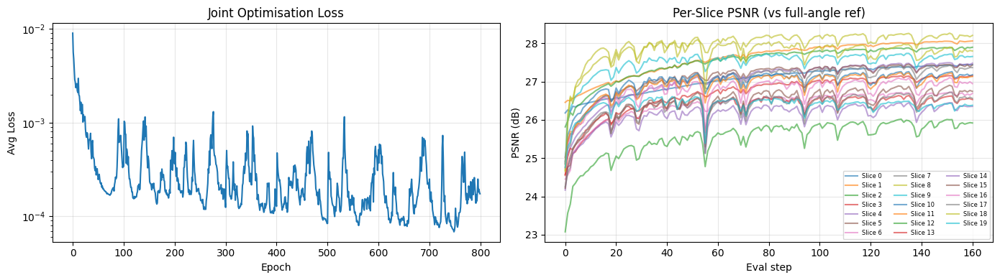

In [127]:
# ── Loss curve ────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

axes[0].semilogy(loss_history)
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Avg Loss')
axes[0].set_title('Joint Optimisation Loss'); axes[0].grid(True, alpha=0.3)

# Per-slice PSNR evolution
for t in range(N_SLICES):
    if per_slice_psnr_history[t]:
        axes[1].plot(per_slice_psnr_history[t], alpha=0.6, label=f'Slice {t}')
axes[1].set_xlabel('Eval step'); axes[1].set_ylabel('PSNR (dB)')
axes[1].set_title('Per-Slice PSNR (vs full-angle ref)')
axes[1].grid(True, alpha=0.3)
axes[1].legend(fontsize=6, ncol=3)
plt.tight_layout(); plt.show()

## 10. Final Reconstructions from Gaussian Splatting

In [158]:
# ── Rasterise all slices and compare to full-angle reference ──────────────
gsplat_recons = []
gsplat_psnrs = []
gsplat_ssims = []

with torch.no_grad():
    for t in range(N_SLICES):
        params_t = apply_cumulative_deltas(base_params_opt, deltas, t)
        rendered, _, _ = render(
            params_t.means, params_t.log_scales, params_t.quats,
            params_t.rgbs, params_t.opacities, viewmat, K_cam, W_img, H_img,
        )
        img_t = rendered[:, :, 0].cpu()
        
        # Unnormalise to original range for comparison
        smin, smax = slice_norms[t]
        img_t_unnorm = img_t * (smax - smin) + smin
        gsplat_recons.append(img_t_unnorm)
        
        # Metrics vs full-angle reference
        ref_t = full_recons[t].numpy()
        recon_np = img_t_unnorm.numpy()
        p = psnr(np.clip(recon_np, ref_t.min(), ref_t.max()), ref_t)
        s = ssim(np.clip(recon_np, ref_t.min(), ref_t.max()), ref_t)
        gsplat_psnrs.append(p)
        gsplat_ssims.append(s)

gsplat_recons = torch.stack(gsplat_recons, dim=0)
print(f"GSplat reconstruction stack: {gsplat_recons.shape}")

GSplat reconstruction stack: torch.Size([20, 1280, 1280])


In [ ]:
from skimage.metrics import structural_similarity as _ssim
def psnr(prediction: np.ndarray, target: np.ndarray) -> float:
    """Peak signal-to-noise ratio (dB)."""
    data_range = float(target.max() - target.min())
    mse = float(np.mean((np.clip(prediction, target.min(), target.max()) - target) ** 2))
    return 10 * math.log10(data_range ** 2 / (mse + 1e-10))


def ssim(prediction: np.ndarray, target: np.ndarray, data_range: float = None) -> float:
    """Structural similarity index."""
    if data_range is None:
        data_range = float(target.max() - target.min())
    return float(_ssim(target, np.clip(prediction, 0, 1), data_range=data_range))

In [159]:
# ── Also compute limited-angle classical reconstructions for comparison ───
la_fbp_recons = []
for i in range(N_SLICES):
    sino = la_data.limited_sinograms[i].to(device)       # (k, W)
    sino_vrc = sino.unsqueeze(1)                           # (k, 1, W)
    angles = la_data.slice_angles_deg[i]
    recon_3d = fbp_reconstruction_masked(
        projs_vrc=sino_vrc, angles_deg=angles,
        lamino_angle_deg=LAMINO_ANGLE_DEG,
        vol_shape=vol_shape_3d,
        det_spacing_mm=DET_SPACING_MM, filter_type='hann', device=device,
    )
    la_fbp_recons.append(recon_3d[0].cpu())               # (ny, nx)
la_fbp_recons = torch.stack(la_fbp_recons, dim=0)

In [160]:
# ── Comparison table ──────────────────────────────────────────────────────
from skimage.metrics import structural_similarity

def compute_psnr_np(a, b):
    mse_val = np.mean((a - b) ** 2)
    dr = b.max() - b.min()
    return 10 * np.log10(dr**2 / (mse_val + 1e-12))

def compute_ssim_np(a, b):
    dr = b.max() - b.min()
    return structural_similarity(b, a, data_range=dr)

la_fbp_psnrs = []
la_fbp_ssims = []
for i in range(N_SLICES):
    ref = full_recons[i].numpy()
    la_r = la_fbp_recons[i].numpy()
    la_fbp_psnrs.append(compute_psnr_np(la_r, ref))
    la_fbp_ssims.append(compute_ssim_np(la_r, ref))

print(f"{'Slice':>6}  {'FBP-LA PSNR':>12}  {'GSplat PSNR':>12}  {'Δ PSNR':>8}  "
      f"{'FBP-LA SSIM':>12}  {'GSplat SSIM':>12}")
print("-" * 75)
for i in range(N_SLICES):
    dp = gsplat_psnrs[i] - la_fbp_psnrs[i]
    print(f"{i:>6d}  {la_fbp_psnrs[i]:>12.2f}  {gsplat_psnrs[i]:>12.2f}  {dp:>+8.2f}  "
          f"{la_fbp_ssims[i]:>12.4f}  {gsplat_ssims[i]:>12.4f}")

print("-" * 75)
avg_la = np.mean(la_fbp_psnrs)
avg_gs = np.mean(gsplat_psnrs)
print(f"{'AVG':>6}  {avg_la:>12.2f}  {avg_gs:>12.2f}  {avg_gs-avg_la:>+8.2f}  "
      f"{np.mean(la_fbp_ssims):>12.4f}  {np.mean(gsplat_ssims):>12.4f}")

 Slice   FBP-LA PSNR   GSplat PSNR    Δ PSNR   FBP-LA SSIM   GSplat SSIM
---------------------------------------------------------------------------
     0         13.91         27.43    +13.52        0.2243        0.6720
     1         14.09         28.05    +13.96        0.2180        0.7012
     2         15.08         27.88    +12.81        0.2620        0.7032
     3         14.31         27.14    +12.83        0.2369        0.6855
     4         13.58         27.47    +13.89        0.2428        0.6945
     5         14.58         27.43    +12.84        0.2340        0.6946
     6         14.32         26.68    +12.36        0.2609        0.6759
     7         14.91         27.35    +12.45        0.2502        0.6939
     8         14.72         28.20    +13.48        0.2650        0.7181
     9         15.45         27.65    +12.20        0.2428        0.7067
    10         15.13         27.17    +12.04        0.2654        0.6941
    11         14.83         27.12    +12.29    

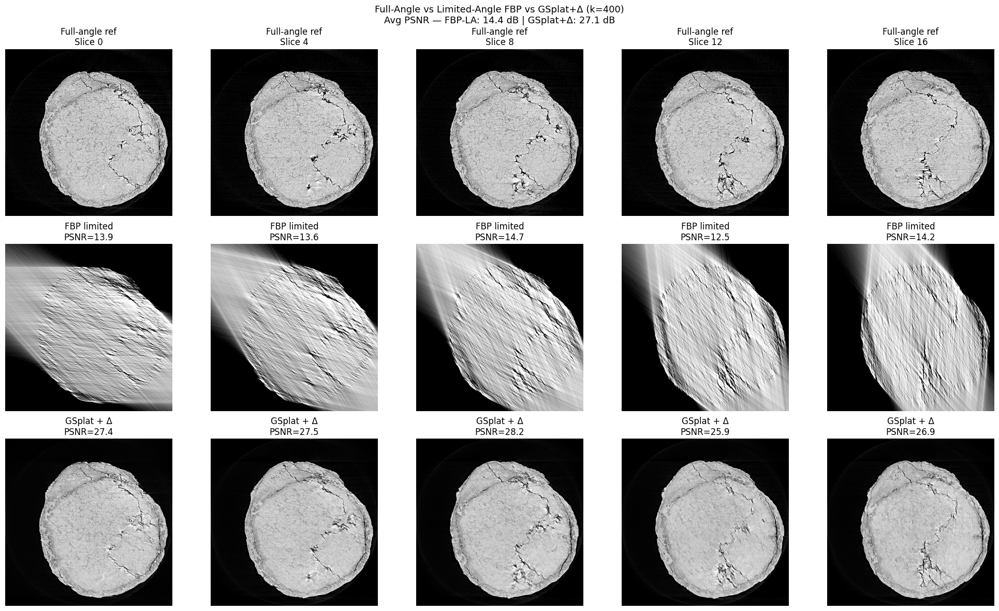

In [161]:
# ── Visual comparison grid ────────────────────────────────────────────────
n_show = min(5, N_SLICES)
fig, axes = plt.subplots(3, n_show, figsize=(4 * n_show, 12))

for j in range(n_show):
    idx = j * (N_SLICES // n_show) if n_show < N_SLICES else j
    ref = full_recons[idx].numpy()
    vmin, vmax = np.percentile(ref, [2, 98])
    
    axes[0, j].imshow(ref, cmap='gray', vmin=vmin, vmax=vmax)
    axes[0, j].set_title(f'Full-angle ref\nSlice {idx}')
    axes[0, j].axis('off')
    
    la_r = la_fbp_recons[idx].numpy()
    axes[1, j].imshow(la_r, cmap='gray', vmin=vmin, vmax=vmax)
    axes[1, j].set_title(f'FBP limited\nPSNR={la_fbp_psnrs[idx]:.1f}')
    axes[1, j].axis('off')
    
    gs_r = gsplat_recons[idx].numpy()
    axes[2, j].imshow(gs_r, cmap='gray', vmin=vmin, vmax=vmax)
    axes[2, j].set_title(f'GSplat + Δ\nPSNR={gsplat_psnrs[idx]:.1f}')
    axes[2, j].axis('off')

plt.suptitle(
    f'Full-Angle vs Limited-Angle FBP vs GSplat+Δ (k={K_ANGLES})\n'
    f'Avg PSNR — FBP-LA: {avg_la:.1f} dB | GSplat+Δ: {avg_gs:.1f} dB',
    fontsize=13,
)
plt.tight_layout()
plt.show()

## 11. Delta Analysis

Visualise how the deltas evolve over time — they should be small and smooth.

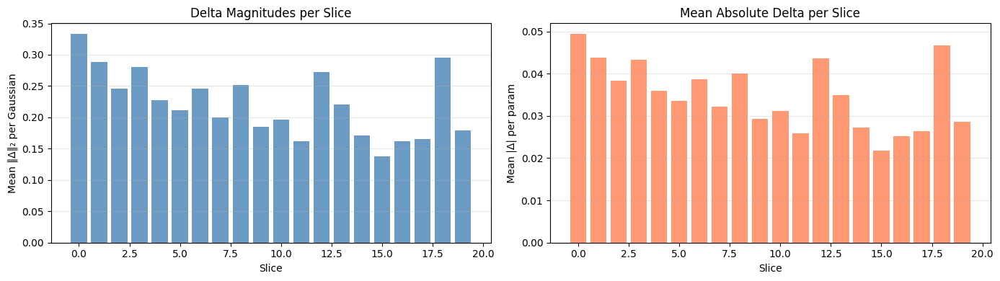

In [162]:
# ── Delta magnitudes over time ────────────────────────────────────────────
delta_norms = []
delta_means = []
with torch.no_grad():
    for t in range(N_SLICES):
        d = deltas[t].detach()
        delta_norms.append(torch.norm(d, dim=1).mean().item())
        delta_means.append(d.abs().mean().item())

fig, axes = plt.subplots(1, 2, figsize=(14, 4))

axes[0].bar(range(N_SLICES), delta_norms, color='steelblue', alpha=0.8)
axes[0].set_xlabel('Slice'); axes[0].set_ylabel('Mean ‖Δ‖₂ per Gaussian')
axes[0].set_title('Delta Magnitudes per Slice')
axes[0].grid(axis='y', alpha=0.3)

axes[1].bar(range(N_SLICES), delta_means, color='coral', alpha=0.8)
axes[1].set_xlabel('Slice'); axes[1].set_ylabel('Mean |Δ| per param')
axes[1].set_title('Mean Absolute Delta per Slice')
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout(); plt.show()

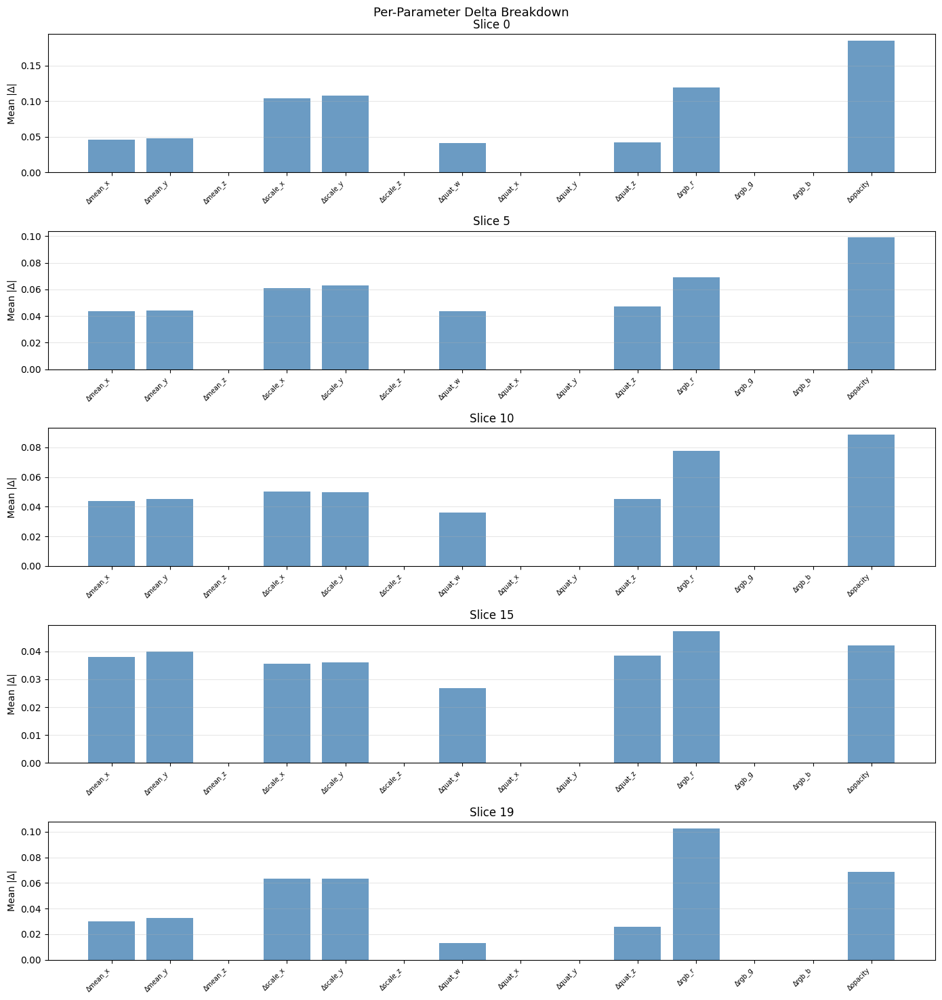

In [163]:
# ── Per-parameter delta breakdown for selected slices ─────────────────────
param_names = (
    ['Δmean_x', 'Δmean_y', 'Δmean_z'] +
    ['Δscale_x', 'Δscale_y', 'Δscale_z'] +
    ['Δquat_w', 'Δquat_x', 'Δquat_y', 'Δquat_z'] +
    ['Δrgb_r', 'Δrgb_g', 'Δrgb_b'] +
    ['Δopacity']
)

show_slices = [0, N_SLICES // 4, N_SLICES // 2, 3 * N_SLICES // 4, N_SLICES - 1]
fig, axes = plt.subplots(len(show_slices), 1, figsize=(14, 3 * len(show_slices)))

for si, t in enumerate(show_slices):
    d_np = deltas[t].detach().cpu().numpy()
    means_per_param = np.abs(d_np).mean(axis=0)
    axes[si].bar(range(D_FULL), means_per_param, color='steelblue', alpha=0.8)
    axes[si].set_xticks(range(D_FULL))
    axes[si].set_xticklabels(param_names, rotation=45, ha='right', fontsize=7)
    axes[si].set_ylabel('Mean |Δ|')
    axes[si].set_title(f'Slice {t}')
    axes[si].grid(axis='y', alpha=0.3)

plt.suptitle('Per-Parameter Delta Breakdown', fontsize=13)
plt.tight_layout(); plt.show()

## 12. Movie: Time Evolution

Visualise how the reconstructed slices evolve over the time axis (height).

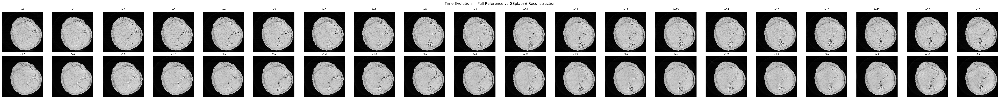

In [134]:
# ── Time evolution montage ────────────────────────────────────────────────
fig, axes = plt.subplots(2, N_SLICES, figsize=(2.5 * N_SLICES, 5))

for t in range(N_SLICES):
    ref = full_recons[t].numpy()
    vmin, vmax = np.percentile(ref, [2, 98])
    
    axes[0, t].imshow(ref, cmap='gray', vmin=vmin, vmax=vmax)
    axes[0, t].set_title(f't={t}', fontsize=8)
    axes[0, t].axis('off')
    
    gs = gsplat_recons[t].numpy()
    axes[1, t].imshow(gs, cmap='gray', vmin=vmin, vmax=vmax)
    axes[1, t].set_title(f'{gsplat_psnrs[t]:.1f}', fontsize=8)
    axes[1, t].axis('off')

axes[0, 0].set_ylabel('Full-angle\n(reference)', fontsize=9)
axes[1, 0].set_ylabel('GSplat + Δ', fontsize=9)
plt.suptitle('Time Evolution — Full Reference vs GSplat+Δ Reconstruction', fontsize=13)
plt.tight_layout(); plt.show()

In [164]:
# ── Final summary ─────────────────────────────────────────────────────────
print("=" * 60)
print("  TIME-RESOLVED LIMITED-ANGLE CT — FINAL RESULTS")
print("=" * 60)
print(f"  Slices:         {N_SLICES}")
print(f"  Angles/slice:   {K_ANGLES}")
print(f"  Gaussians:      {base_params_opt.n_gaussians:,}")
print(f"  Joint epochs:   {JOINT_EPOCHS}")
print(f"  Training time:  {elapsed_joint:.1f}s")
print()
print(f"  {'Method':<20} {'Avg PSNR':>10} {'Avg SSIM':>10}")
print(f"  {'-'*42}")
print(f"  {'FBP limited-angle':<20} {np.mean(la_fbp_psnrs):>10.2f} {np.mean(la_fbp_ssims):>10.4f}")
print(f"  {'GSplat + Δ':<20} {np.mean(gsplat_psnrs):>10.2f} {np.mean(gsplat_ssims):>10.4f}")
print(f"  {'Δ improvement':<20} {np.mean(gsplat_psnrs)-np.mean(la_fbp_psnrs):>+10.2f} "
      f"{np.mean(gsplat_ssims)-np.mean(la_fbp_ssims):>+10.4f}")
print("=" * 60)

  TIME-RESOLVED LIMITED-ANGLE CT — FINAL RESULTS
  Slices:         20
  Angles/slice:   400
  Gaussians:      200,705
  Joint epochs:   800
  Training time:  574.3s

  Method                 Avg PSNR   Avg SSIM
  ------------------------------------------
  FBP limited-angle         14.44     0.2427
  GSplat + Δ                27.14     0.6884
  Δ improvement            +12.70    +0.4457


## 14. Batched Joint Reconstruction with Slice Mask

**Improved formulation** over Section 8:

1. Rasterise ALL slices from Gaussians → pack into 3D volume $(T, H, W)$
2. Forward-project the full volume at a **batch of angles** → sinogram $(V_\text{batch}, T, W)$
3. Build a 2D mask $M \in \{0,1\}^{V \times T}$ where $M_{v,t}=1$ iff slice $t$ has a measurement at angle $v$
4. Compute loss **only on masked entries** → backprop updates base + all deltas simultaneously

**Why this is better:**
- **True joint optimisation**: base Gaussians receive gradient from all slices in one step (no sequential bias)
- **Efficient**: one ASTRA forward call per batch covers all slices
- **Clean masking**: the mask naturally handles the fact that different slices observe different angle subsets

Angle-slice mask: (1501, 20)
  Valid entries: 8,000 / 30,020 (26.6%)
  Angles per slice: [400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400]
  Measurements tensor: torch.Size([1501, 20, 1280])


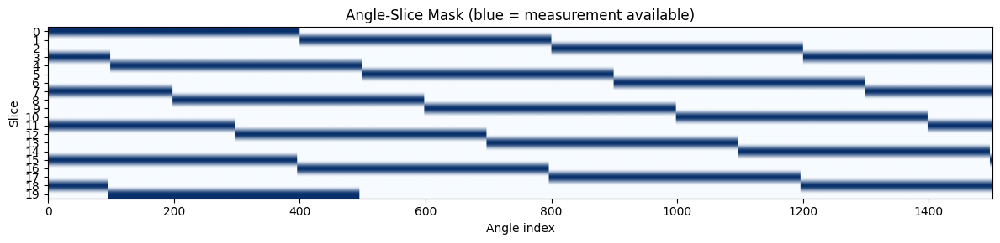

In [136]:
# ══════════════════════════════════════════════════════════════════════════
# Build angle-slice mask
# ══════════════════════════════════════════════════════════════════════════
# mask[v, t] = True iff slice t has a measurement at angle index v

V_total = len(la_data.all_angles_deg)
angle_slice_mask = torch.zeros(V_total, N_SLICES, dtype=torch.bool, device=device)
for t in range(N_SLICES):
    idx = la_data.slice_angle_indices[t]
    angle_slice_mask[idx, t] = True

n_valid = angle_slice_mask.sum().item()
n_total = V_total * N_SLICES
print(f"Angle-slice mask: ({V_total}, {N_SLICES})")
print(f"  Valid entries: {n_valid:,} / {n_total:,} ({100*n_valid/n_total:.1f}%)")
print(f"  Angles per slice: {angle_slice_mask.sum(dim=0).tolist()}")

# Full measurement tensor: (V_total, N_SLICES, W) for indexed access
# la_data.full_sinograms is (N_SLICES, V_total, W), permute to (V_total, N_SLICES, W)
meas_full_vrc = la_data.full_sinograms.to(device).permute(1, 0, 2).contiguous()
print(f"  Measurements tensor: {meas_full_vrc.shape}")

# Visualise the mask
fig, ax = plt.subplots(1, 1, figsize=(12, 3))
ax.imshow(angle_slice_mask.cpu().numpy().T, aspect='auto', cmap='Blues',
          extent=[0, V_total, N_SLICES-0.5, -0.5])
ax.set_xlabel('Angle index'); ax.set_ylabel('Slice')
ax.set_title('Angle-Slice Mask (blue = measurement available)')
ax.set_yticks(range(N_SLICES))
plt.tight_layout(); plt.show()

In [137]:
# ══════════════════════════════════════════════════════════════════════════
# Initialise fresh Gaussians + deltas for fair comparison
# ══════════════════════════════════════════════════════════════════════════

# Fresh base Gaussians (same init as Section 8)
base_v2 = init_gaussians(
    ref_image_0_norm, N_GAUSSIANS, device,
    mode=INIT_MODE, init_scale_px=INIT_SCALE_PX,
    init_opacity=0.3, seed=42,
).require_grad_()
N_v2 = base_v2.n_gaussians

# Fresh deltas (zero-initialised)
deltas_v2 = [
    torch.zeros(N_v2, D_FULL, device=device, requires_grad=True)
    for _ in range(N_SLICES)
]

# 3D volume shape for the batched projector
vol_shape_batched = (N_SLICES, *vol_shape)  # (N_SLICES, ny, nx)
det_shape_batched = (N_SLICES, la_data.W)   # (N_SLICES, det_cols)

print(f"Base Gaussians: {N_v2:,}")
print(f"Deltas: {N_SLICES} × ({N_v2}, {D_FULL})")
print(f"Volume shape for projection: {vol_shape_batched}")
print(f"Detector shape: {det_shape_batched}")

Base Gaussians: 200,704
Deltas: 20 × (200704, 14)
Volume shape for projection: (20, 1280, 1280)
Detector shape: (20, 1280)


In [138]:
# ══════════════════════════════════════════════════════════════════════════
# Hyperparameters for batched joint optimisation
# ══════════════════════════════════════════════════════════════════════════

V2_EPOCHS = 30           # Outer epochs (iterate over all angles)
V2_BATCH_SIZE = 40       # Angles per mini-batch
V2_LR_BASE = 5e-3       # LR for base Gaussian parameters
V2_LR_DELTA = 5e-3      # LR for delta parameters
V2_LAMBDA_DELTA = 1e-5   # L2 penalty on delta magnitudes
V2_LAMBDA_TEMPORAL = 1e-2 # Temporal smoothness
V2_LAMBDA_ZERO_D0 = 1e-2 # Keep delta_0 near zero

# ── Densification config ──────────────────────────────────────────────────
V2_DENSIFY_FROM     = 5     # Start densifying after this many epochs
V2_DENSIFY_INTERVAL = 2     # Densify every N epochs
V2_DENSIFY_UNTIL    = 25     # Stop densifying after this epoch
V2_PRUNE_OPACITY_THRESH = 0.005
V2_SPLIT_SCALE_THRESH   = 10.0

# Optimizer
optimizer_v2 = optim.Adam([
    {"params": base_v2.tensors(), "lr": V2_LR_BASE},
    {"params": deltas_v2, "lr": V2_LR_DELTA},
])

densify_epochs_v2 = []

print(f"Batched optimisation config:")
print(f"  Epochs: {V2_EPOCHS}, Batch size: {V2_BATCH_SIZE} angles")
print(f"  LR base: {V2_LR_BASE}, LR delta: {V2_LR_DELTA}")
print(f"  Batches/epoch: {math.ceil(V_total / V2_BATCH_SIZE)}")
print(f"  Regularisation: λ_delta={V2_LAMBDA_DELTA}, λ_temporal={V2_LAMBDA_TEMPORAL}")
print(f"  Densification: every {V2_DENSIFY_INTERVAL} epochs from {V2_DENSIFY_FROM} to {V2_DENSIFY_UNTIL}")

Batched optimisation config:
  Epochs: 30, Batch size: 40 angles
  LR base: 0.005, LR delta: 0.005
  Batches/epoch: 38
  Regularisation: λ_delta=1e-05, λ_temporal=0.01
  Densification: every 2 epochs from 5 to 25


In [139]:
# ══════════════════════════════════════════════════════════════════════════
# Batched Joint Training Loop
# ══════════════════════════════════════════════════════════════════════════
# Per batch step:
#   1. Rasterise all T slices from Gaussians (base + delta_t) → (T, H, W)
#   2. Forward-project full volume at batch angles → (V_batch, T, W)
#   3. Masked MSE loss on valid (angle, slice) pairs
#   4. One backward + step → base gets gradient from all slices

loss_history_v2 = []
psnr_history_v2 = {t: [] for t in range(N_SLICES)}

n_batches = math.ceil(V_total / V2_BATCH_SIZE)
total_steps = V2_EPOCHS * n_batches

print(f"Starting batched joint optimisation")
print(f"  {V2_EPOCHS} epochs × {n_batches} batches = {total_steps} steps")
print("=" * 70)

t_start_v2 = time.time()
pbar_v2 = tqdm(total=total_steps, desc="Batched Joint", unit="step")

for epoch in range(V2_EPOCHS):
    perm = torch.randperm(V_total, device=device)
    epoch_loss = 0.0
    epoch_data = 0.0
    
    for b in range(n_batches):
        sel = perm[b * V2_BATCH_SIZE : (b + 1) * V2_BATCH_SIZE]
        k = len(sel)
        
        # ── 1. Rasterise all slices ───────────────────────────────────
        images = []
        for t in range(N_SLICES):
            params_t = apply_cumulative_deltas(base_v2, deltas_v2, t)
            rendered_t, _, _ = render(
                params_t.means, params_t.log_scales, params_t.quats,
                params_t.rgbs, params_t.opacities, viewmat, K_cam, W_img, H_img,
            )
            img_t = torch.clamp(rendered_t[:, :, 0], 0.0, 1.0)  # (H, W)
            smin_t, smax_t = slice_norms[t]
            images.append(img_t * (smax_t - smin_t) + smin_t)
        
        vol_3d = torch.stack(images, dim=0)  # (N_SLICES, H, W)
        
        # ── 2. Build projector for this batch of angles ───────────────
        batch_angles = la_data.all_angles_deg[sel.cpu().numpy()]
        proj_batch = build_lamino_projector(
            vol_shape=vol_shape_batched,
            det_shape=det_shape_batched,
            angles_deg=batch_angles,
            lamino_angle_deg=LAMINO_ANGLE_DEG,
            voxel_size_mm=VOXEL_SIZE_MM,
            det_spacing_mm=DET_SPACING_MM,
            device=device,
        )
        
        # ── 3. Forward project ────────────────────────────────────────
        vol_input = vol_3d.unsqueeze(0).unsqueeze(0)  # (1, 1, T, H, W)
        sino_pred = proj_batch(vol_input)[0]           # (V_batch, T, W)
        
        # ── 4. Masked loss ────────────────────────────────────────────
        sino_meas_batch = meas_full_vrc[sel]           # (V_batch, T, W)
        mask_batch = angle_slice_mask[sel]              # (V_batch, T)
        
        # Select only valid (angle, slice) pairs
        sino_pred_valid = sino_pred[mask_batch]        # (n_valid, W)
        sino_meas_valid = sino_meas_batch[mask_batch]  # (n_valid, W)
        
        if sino_pred_valid.numel() > 0:
            data_loss = F.mse_loss(sino_pred_valid, sino_meas_valid)
        else:
            data_loss = torch.tensor(0.0, device=device)
        
        # ── 5. Regularisation ─────────────────────────────────────────
        reg = torch.tensor(0.0, device=device)
        for t in range(N_SLICES):
            reg = reg + V2_LAMBDA_DELTA * torch.mean(deltas_v2[t] ** 2)
            if t > 0:
                reg = reg + V2_LAMBDA_TEMPORAL * torch.mean(
                    (deltas_v2[t] - deltas_v2[t-1]) ** 2
                )
        reg = reg + V2_LAMBDA_ZERO_D0 * torch.mean(deltas_v2[0] ** 2)
        
        loss = data_loss + reg
        
        # ── 6. Backward + step ────────────────────────────────────────
        optimizer_v2.zero_grad(set_to_none=True)
        loss.backward()
        optimizer_v2.step()
        
        epoch_loss += loss.item() * k
        epoch_data += data_loss.item() * k
        
        pbar_v2.update(1)
        pbar_v2.set_postfix({
            'loss': f"{loss.item():.3e}",
            'data': f"{data_loss.item():.3e}",
            'valid': f"{mask_batch.sum().item()}/{k*N_SLICES}",
        })
    
    # ── Epoch logging ─────────────────────────────────────────────────
    avg_loss = epoch_loss / V_total
    avg_data = epoch_data / V_total
    loss_history_v2.append(avg_loss)
    
    # Evaluate image-space PSNR
    with torch.no_grad():
        slice_psnrs_v2 = []
        for t in range(N_SLICES):
            params_t = apply_cumulative_deltas(base_v2, deltas_v2, t)
            rend_t, _, _ = render(
                params_t.means, params_t.log_scales, params_t.quats,
                params_t.rgbs, params_t.opacities, viewmat, K_cam, W_img, H_img,
            )
            img_np = np.clip(rend_t[:, :, 0].cpu().numpy(), 0, 1)
            ref_t = full_recons[t].numpy()
            smin_t, smax_t = slice_norms[t]
            ref_norm = (ref_t - smin_t) / (smax_t - smin_t + 1e-8)
            p = psnr(img_np, ref_norm)
            psnr_history_v2[t].append(p)
            slice_psnrs_v2.append(p)
    
    avg_p = np.mean(slice_psnrs_v2)
    elapsed = time.time() - t_start_v2
    print(f"  Epoch {epoch+1}/{V2_EPOCHS} | "
          f"loss={avg_loss:.3e} (data={avg_data:.3e}) | "
          f"avg PSNR={avg_p:.2f} dB [min={min(slice_psnrs_v2):.1f}, max={max(slice_psnrs_v2):.1f}] | "
          f"N={base_v2.n_gaussians:,} | {elapsed:.0f}s")

    # ── Adaptive densification (epoch-level) ──────────────────────────
    if (V2_DENSIFY_FROM <= epoch < V2_DENSIFY_UNTIL
            and epoch % V2_DENSIFY_INTERVAL == 0
            and epoch > 0):
        base_v2, deltas_v2, n_pruned, n_split = densify_with_deltas(
            base_v2, deltas_v2,
            V2_PRUNE_OPACITY_THRESH, V2_SPLIT_SCALE_THRESH,
        )
        # Update vol_shape_batched in case N changed (shape is spatial, not N — no change needed)
        optimizer_v2 = optim.Adam([
            {"params": base_v2.tensors(), "lr": V2_LR_BASE},
            {"params": deltas_v2, "lr": V2_LR_DELTA},
        ])
        densify_epochs_v2.append(epoch)
        print(f"  ↳ [densify @ epoch {epoch}] pruned={n_pruned}  "
              f"split={n_split}  N={base_v2.n_gaussians:,}")

pbar_v2.close()
elapsed_v2 = time.time() - t_start_v2
print(f"\n✅ Batched joint optimisation done in {elapsed_v2:.1f}s")

Starting batched joint optimisation
  30 epochs × 38 batches = 1140 steps


Batched Joint:   0%|          | 1/1140 [00:00<03:49,  4.97step/s, loss=8.293e-03, data=8.293e-03, valid=214/800]

Batched Joint:   3%|▎         | 38/1140 [00:08<03:40,  5.00step/s, loss=1.334e-03, data=1.298e-03, valid=110/420]

  Epoch 1/30 | loss=2.920e-03 (data=2.907e-03) | avg PSNR=25.55 dB [min=24.0, max=26.8] | N=200,704 | 8s


Batched Joint:   7%|▋         | 76/1140 [00:15<03:26,  5.16step/s, loss=5.949e-04, data=5.063e-04, valid=109/420]

  Epoch 2/30 | loss=8.632e-04 (data=7.980e-04) | avg PSNR=25.80 dB [min=24.3, max=27.2] | N=200,704 | 16s


Batched Joint:  10%|█         | 115/1140 [00:23<04:01,  4.25step/s, loss=3.852e-04, data=2.850e-04, valid=217/800]

  Epoch 3/30 | loss=4.671e-04 (data=3.700e-04) | avg PSNR=25.98 dB [min=24.5, max=27.4] | N=200,704 | 24s


Batched Joint:  13%|█▎        | 153/1140 [00:31<03:52,  4.24step/s, loss=3.313e-04, data=2.383e-04, valid=214/800]

  Epoch 4/30 | loss=3.574e-04 (data=2.600e-04) | avg PSNR=26.11 dB [min=24.7, max=27.5] | N=200,704 | 31s


Batched Joint:  17%|█▋        | 190/1140 [00:38<02:55,  5.41step/s, loss=2.875e-04, data=2.043e-04, valid=114/420]

  Epoch 5/30 | loss=3.114e-04 (data=2.232e-04) | avg PSNR=26.20 dB [min=24.8, max=27.6] | N=200,704 | 39s


Batched Joint:  20%|██        | 228/1140 [00:46<02:48,  5.42step/s, loss=2.797e-04, data=2.045e-04, valid=114/420]

  Epoch 6/30 | loss=2.908e-04 (data=2.118e-04) | avg PSNR=26.27 dB [min=24.8, max=27.7] | N=200,704 | 47s


Batched Joint:  23%|██▎       | 267/1140 [00:54<03:19,  4.37step/s, loss=2.473e-04, data=1.794e-04, valid=216/800]

  Epoch 7/30 | loss=2.598e-04 (data=1.882e-04) | avg PSNR=26.33 dB [min=24.9, max=27.7] | N=200,704 | 55s
  ↳ [densify @ epoch 6] pruned=0  split=0  N=200,704


Batched Joint:  27%|██▋       | 305/1140 [01:02<03:16,  4.24step/s, loss=3.433e-04, data=2.750e-04, valid=216/800]

  Epoch 8/30 | loss=9.663e-04 (data=8.986e-04) | avg PSNR=26.29 dB [min=24.8, max=27.5] | N=200,704 | 62s


Batched Joint:  30%|███       | 342/1140 [01:09<02:29,  5.32step/s, loss=2.470e-04, data=1.792e-04, valid=113/420]

  Epoch 9/30 | loss=2.646e-04 (data=1.962e-04) | avg PSNR=26.36 dB [min=24.9, max=27.7] | N=200,704 | 70s
  ↳ [densify @ epoch 8] pruned=0  split=0  N=200,704


Batched Joint:  33%|███▎      | 380/1140 [01:17<02:31,  5.03step/s, loss=2.561e-04, data=1.881e-04, valid=113/420]

  Epoch 10/30 | loss=6.656e-04 (data=5.982e-04) | avg PSNR=26.36 dB [min=24.9, max=27.6] | N=200,704 | 78s


Batched Joint:  37%|███▋      | 418/1140 [01:25<02:13,  5.40step/s, loss=2.390e-04, data=1.729e-04, valid=111/420]

  Epoch 11/30 | loss=2.510e-04 (data=1.837e-04) | avg PSNR=26.40 dB [min=24.9, max=27.7] | N=200,704 | 86s
  ↳ [densify @ epoch 10] pruned=0  split=0  N=200,704


Batched Joint:  40%|████      | 457/1140 [01:33<02:34,  4.43step/s, loss=2.631e-04, data=1.963e-04, valid=213/800]

  Epoch 12/30 | loss=4.764e-04 (data=4.103e-04) | avg PSNR=26.41 dB [min=24.9, max=27.7] | N=200,704 | 93s


Batched Joint:  43%|████▎     | 495/1140 [01:41<02:28,  4.35step/s, loss=2.234e-04, data=1.596e-04, valid=209/800]

  Epoch 13/30 | loss=2.372e-04 (data=1.715e-04) | avg PSNR=26.45 dB [min=24.9, max=27.7] | N=200,704 | 101s
  ↳ [densify @ epoch 12] pruned=0  split=0  N=200,704


Batched Joint:  47%|████▋     | 532/1140 [01:48<01:55,  5.27step/s, loss=2.429e-04, data=1.781e-04, valid=115/420]

  Epoch 14/30 | loss=4.745e-04 (data=4.101e-04) | avg PSNR=26.45 dB [min=24.9, max=27.7] | N=200,704 | 109s


Batched Joint:  50%|█████     | 570/1140 [01:56<01:54,  4.99step/s, loss=2.185e-04, data=1.564e-04, valid=111/420]

  Epoch 15/30 | loss=2.298e-04 (data=1.661e-04) | avg PSNR=26.48 dB [min=24.9, max=27.7] | N=200,704 | 117s
  ↳ [densify @ epoch 14] pruned=0  split=0  N=200,704


Batched Joint:  53%|█████▎    | 608/1140 [02:04<01:38,  5.42step/s, loss=2.849e-04, data=2.229e-04, valid=118/420]

  Epoch 16/30 | loss=5.959e-04 (data=5.341e-04) | avg PSNR=26.45 dB [min=24.9, max=27.6] | N=200,704 | 124s


Batched Joint:  57%|█████▋    | 646/1140 [02:11<01:35,  5.17step/s, loss=2.177e-04, data=1.575e-04, valid=112/420]

  Epoch 17/30 | loss=2.278e-04 (data=1.666e-04) | avg PSNR=26.49 dB [min=24.9, max=27.7] | N=200,704 | 132s
  ↳ [densify @ epoch 16] pruned=0  split=0  N=200,704


Batched Joint:  60%|██████    | 685/1140 [02:20<01:44,  4.37step/s, loss=2.257e-04, data=1.660e-04, valid=216/800]

  Epoch 18/30 | loss=4.274e-04 (data=3.677e-04) | avg PSNR=26.49 dB [min=24.9, max=27.7] | N=200,704 | 140s


Batched Joint:  63%|██████▎   | 723/1140 [02:28<01:34,  4.42step/s, loss=2.097e-04, data=1.529e-04, valid=218/800]

  Epoch 19/30 | loss=2.145e-04 (data=1.561e-04) | avg PSNR=26.53 dB [min=24.9, max=27.7] | N=200,704 | 148s
  ↳ [densify @ epoch 18] pruned=0  split=0  N=200,704


Batched Joint:  67%|██████▋   | 761/1140 [02:36<01:28,  4.30step/s, loss=2.401e-04, data=1.829e-04, valid=215/800]

  Epoch 20/30 | loss=4.451e-04 (data=3.883e-04) | avg PSNR=26.53 dB [min=24.8, max=27.7] | N=200,704 | 156s


Batched Joint:  70%|███████   | 798/1140 [02:43<01:08,  4.99step/s, loss=2.017e-04, data=1.465e-04, valid=114/420]

  Epoch 21/30 | loss=2.090e-04 (data=1.527e-04) | avg PSNR=26.55 dB [min=24.9, max=27.7] | N=200,704 | 164s
  ↳ [densify @ epoch 20] pruned=0  split=0  N=200,704


Batched Joint:  73%|███████▎  | 836/1140 [02:51<00:58,  5.18step/s, loss=2.373e-04, data=1.810e-04, valid=111/420]

  Epoch 22/30 | loss=4.894e-04 (data=4.337e-04) | avg PSNR=26.54 dB [min=24.8, max=27.7] | N=200,704 | 172s


Batched Joint:  77%|███████▋  | 874/1140 [02:59<00:53,  5.01step/s, loss=2.045e-04, data=1.499e-04, valid=111/420]

  Epoch 23/30 | loss=2.073e-04 (data=1.517e-04) | avg PSNR=26.57 dB [min=24.8, max=27.7] | N=200,704 | 180s
  ↳ [densify @ epoch 22] pruned=0  split=0  N=200,704


Batched Joint:  80%|████████  | 912/1140 [03:07<00:43,  5.22step/s, loss=2.030e-04, data=1.489e-04, valid=112/420]

  Epoch 24/30 | loss=3.261e-04 (data=2.718e-04) | avg PSNR=26.58 dB [min=24.8, max=27.7] | N=200,704 | 188s


Batched Joint:  83%|████████▎ | 950/1140 [03:15<00:37,  5.06step/s, loss=1.838e-04, data=1.320e-04, valid=111/420]

  Epoch 25/30 | loss=1.952e-04 (data=1.421e-04) | avg PSNR=26.60 dB [min=24.9, max=27.8] | N=200,704 | 196s
  ↳ [densify @ epoch 24] pruned=0  split=0  N=200,704


Batched Joint:  87%|████████▋ | 988/1140 [03:23<00:30,  5.06step/s, loss=2.317e-04, data=1.790e-04, valid=111/420]

  Epoch 26/30 | loss=4.675e-04 (data=4.153e-04) | avg PSNR=26.59 dB [min=24.8, max=27.8] | N=200,704 | 204s


Batched Joint:  90%|█████████ | 1027/1140 [03:31<00:26,  4.25step/s, loss=1.812e-04, data=1.297e-04, valid=213/800]

  Epoch 27/30 | loss=1.951e-04 (data=1.429e-04) | avg PSNR=26.62 dB [min=24.8, max=27.8] | N=200,704 | 212s


Batched Joint:  93%|█████████▎| 1064/1140 [03:39<00:14,  5.31step/s, loss=1.872e-04, data=1.378e-04, valid=113/420]

  Epoch 28/30 | loss=1.837e-04 (data=1.333e-04) | avg PSNR=26.63 dB [min=24.8, max=27.8] | N=200,704 | 220s


Batched Joint:  97%|█████████▋| 1102/1140 [03:47<00:07,  5.10step/s, loss=1.772e-04, data=1.298e-04, valid=112/420]

  Epoch 29/30 | loss=1.781e-04 (data=1.297e-04) | avg PSNR=26.64 dB [min=24.9, max=27.8] | N=200,704 | 227s


Batched Joint: 100%|██████████| 1140/1140 [03:55<00:00,  4.84step/s, loss=1.710e-04, data=1.254e-04, valid=112/420]

  Epoch 30/30 | loss=1.730e-04 (data=1.265e-04) | avg PSNR=26.65 dB [min=24.9, max=27.8] | N=200,704 | 235s

✅ Batched joint optimisation done in 235.3s


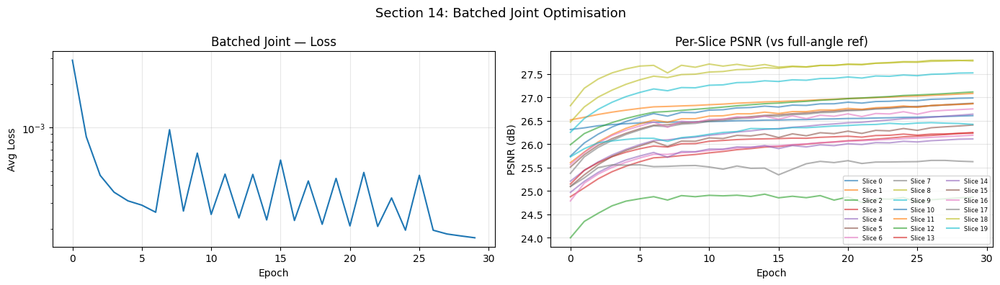

In [140]:
# ── Training curves ───────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

axes[0].semilogy(loss_history_v2)
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Avg Loss')
axes[0].set_title('Batched Joint — Loss'); axes[0].grid(True, alpha=0.3)

for t in range(N_SLICES):
    if psnr_history_v2[t]:
        axes[1].plot(psnr_history_v2[t], alpha=0.6, label=f'Slice {t}')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('PSNR (dB)')
axes[1].set_title('Per-Slice PSNR (vs full-angle ref)')
axes[1].grid(True, alpha=0.3)
axes[1].legend(fontsize=6, ncol=3)
plt.suptitle('Section 14: Batched Joint Optimisation', fontsize=13)
plt.tight_layout(); plt.show()

In [165]:
# ══════════════════════════════════════════════════════════════════════════
# Evaluation: Compare Section 8 (per-slice) vs Section 14 (batched)
# ══════════════════════════════════════════════════════════════════════════

# Rasterise all slices from the batched model
gsplat_recons_v2 = []
gsplat_psnrs_v2 = []
gsplat_ssims_v2 = []

with torch.no_grad():
    for t in range(N_SLICES):
        params_t = apply_cumulative_deltas(base_v2, deltas_v2, t)
        rendered_t, _, _ = render(
            params_t.means, params_t.log_scales, params_t.quats,
            params_t.rgbs, params_t.opacities, viewmat, K_cam, W_img, H_img,
        )
        img_t = rendered_t[:, :, 0].cpu()
        smin_t, smax_t = slice_norms[t]
        img_unnorm = img_t * (smax_t - smin_t) + smin_t
        gsplat_recons_v2.append(img_unnorm)
        
        ref_t = full_recons[t].numpy()
        rec_np = img_unnorm.numpy()
        p = psnr(np.clip(rec_np, ref_t.min(), ref_t.max()), ref_t)
        s = ssim(np.clip(rec_np, ref_t.min(), ref_t.max()), ref_t)
        gsplat_psnrs_v2.append(p)
        gsplat_ssims_v2.append(s)

gsplat_recons_v2 = torch.stack(gsplat_recons_v2, dim=0)

# ── Comparison table: FBP-LA vs Section 8 vs Section 14 ──────────────────
print(f"{'Slice':>6}  {'FBP-LA':>10}  {'Sec8 PSNR':>10}  {'Sec14 PSNR':>11}  "
      f"{'Δ(14-8)':>8}  {'Sec8 SSIM':>10}  {'Sec14 SSIM':>11}")
print("-" * 85)
for i in range(N_SLICES):
    dp = gsplat_psnrs_v2[i] - gsplat_psnrs[i]
    print(f"{i:>6d}  {la_fbp_psnrs[i]:>10.2f}  {gsplat_psnrs[i]:>10.2f}  "
          f"{gsplat_psnrs_v2[i]:>11.2f}  {dp:>+8.2f}  "
          f"{gsplat_ssims[i]:>10.4f}  {gsplat_ssims_v2[i]:>11.4f}")

print("-" * 85)
avg_la = np.mean(la_fbp_psnrs)
avg_s8 = np.mean(gsplat_psnrs)
avg_s14 = np.mean(gsplat_psnrs_v2)
print(f"{'AVG':>6}  {avg_la:>10.2f}  {avg_s8:>10.2f}  {avg_s14:>11.2f}  "
      f"{avg_s14-avg_s8:>+8.2f}  "
      f"{np.mean(gsplat_ssims):>10.4f}  {np.mean(gsplat_ssims_v2):>11.4f}")
print()
print(f"  Section 8 training time:  {elapsed_joint:.1f}s ({JOINT_EPOCHS} epochs)")
print(f"  Section 14 training time: {elapsed_v2:.1f}s ({V2_EPOCHS} epochs)")

 Slice      FBP-LA   Sec8 PSNR   Sec14 PSNR   Δ(14-8)   Sec8 SSIM   Sec14 SSIM
-------------------------------------------------------------------------------------
     0       13.91       27.43        26.60     -0.83      0.6720       0.6019
     1       14.09       28.05        27.07     -0.97      0.7012       0.6226
     2       15.08       27.88        27.11     -0.78      0.7032       0.6279
     3       14.31       27.14        26.24     -0.90      0.6855       0.6135
     4       13.58       27.47        26.63     -0.84      0.6945       0.6323
     5       14.58       27.43        26.86     -0.57      0.6946       0.6457
     6       14.32       26.68        26.18     -0.50      0.6759       0.6315
     7       14.91       27.35        26.87     -0.49      0.6939       0.6522
     8       14.72       28.20        27.79     -0.41      0.7181       0.6828
     9       15.45       27.65        27.52     -0.13      0.7067       0.6770
    10       15.13       27.17        26.98  

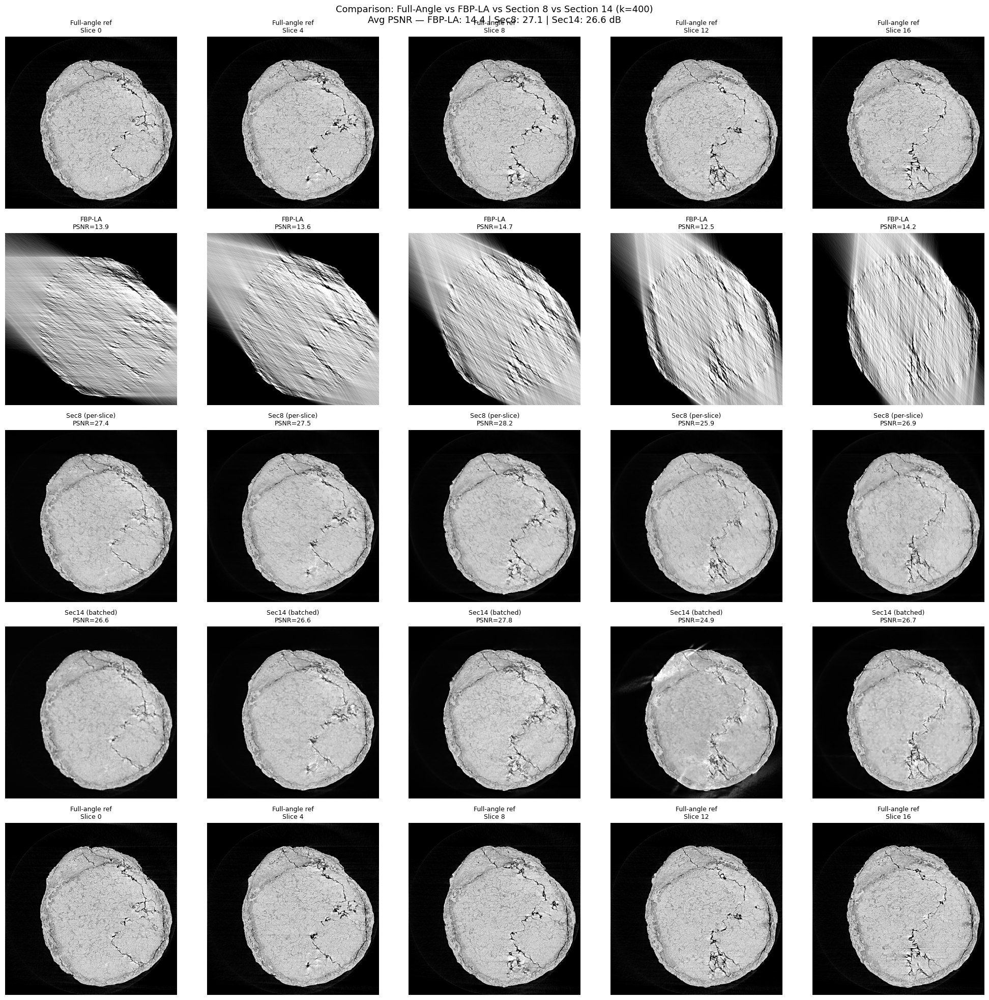

In [166]:
# ── Visual comparison: Section 8 vs Section 14 ────────────────────────────
n_show = min(5, N_SLICES)
fig, axes = plt.subplots(5, n_show, figsize=(4 * n_show, 20))

for j in range(n_show):
    idx = j * (N_SLICES // n_show) if n_show < N_SLICES else j
    ref = full_recons[idx].numpy()
    vmin, vmax = np.percentile(ref, [2, 98])
    
    # Row 0: Full-angle reference
    axes[0, j].imshow(ref, cmap='gray', vmin=vmin, vmax=vmax)
    axes[0, j].set_title(f'Full-angle ref\nSlice {idx}', fontsize=9)
    axes[0, j].axis('off')
    
    # Row 1: FBP limited-angle
    la_r = la_fbp_recons[idx].numpy()
    axes[1, j].imshow(la_r, cmap='gray', vmin=vmin, vmax=vmax)
    axes[1, j].set_title(f'FBP-LA\nPSNR={la_fbp_psnrs[idx]:.1f}', fontsize=9)
    axes[1, j].axis('off')
    
    # Row 2: Section 8 (per-slice)
    gs8 = gsplat_recons[idx].numpy()
    axes[2, j].imshow(gs8, cmap='gray', vmin=vmin, vmax=vmax)
    axes[2, j].set_title(f'Sec8 (per-slice)\nPSNR={gsplat_psnrs[idx]:.1f}', fontsize=9)
    axes[2, j].axis('off')
    
    # Row 3: Section 14 (batched)
    gs14 = gsplat_recons_v2[idx].numpy()
    axes[3, j].imshow(gs14, cmap='gray', vmin=vmin, vmax=vmax)
    axes[3, j].set_title(f'Sec14 (batched)\nPSNR={gsplat_psnrs_v2[idx]:.1f}', fontsize=9)
    axes[3, j].axis('off')

    # Row 0: Full-angle reference
    axes[4, j].imshow(ref, cmap='gray', vmin=vmin, vmax=vmax)
    axes[4, j].set_title(f'Full-angle ref\nSlice {idx}', fontsize=9)
    axes[4, j].axis('off')
plt.suptitle(
    f'Comparison: Full-Angle vs FBP-LA vs Section 8 vs Section 14 (k={K_ANGLES})\n'
    f'Avg PSNR — FBP-LA: {avg_la:.1f} | Sec8: {avg_s8:.1f} | Sec14: {avg_s14:.1f} dB',
    fontsize=13,
)
plt.tight_layout()
plt.show()

## 15. Baseline: Pooled-Projection "Mean" Reconstruction

**Idea:** Ignore time — pool all limited-angle sinograms from all slices into a single combined sinogram (as if every angle came from the same static object) and reconstruct once with FBP.

This is the simplest possible baseline: it assumes the object doesn't move. The result is a single "mean" reconstruction compared against every slice. If it scores worse than FBP-LA (per-slice), it confirms the temporal variation is significant enough that mixing projections from different time-steps hurts more than having fewer angles.

Pooled sinogram: 1501 angles total, 1501 covered (100.0%), 0 zero-filled



 Slice   Pooled FBP    FBP-LA   Sec8 GSplat   Sec14 GSplat
------------------------------------------------------------
     0        24.30     13.91         74.69          73.86
     1        24.92     14.09         75.13          74.16
     2        25.32     15.08         74.65          73.87
     3        24.51     14.31         74.70          73.80
     4        24.90     13.58         74.61          73.78
     5        25.26     14.58         74.24          73.68
     6        24.61     14.32         74.17          73.67
     7        25.14     14.91         74.30          73.81
     8        26.25     14.72         74.01          73.60
     9        25.94     15.45         73.75          73.62
    10        25.40     15.13         73.84          73.65
    11        25.24     14.83         73.96          73.69
    12        23.79     12.48         74.16          73.11
    13        24.79     14.49         73.74          73.44
    14        24.43     14.28         73.97          

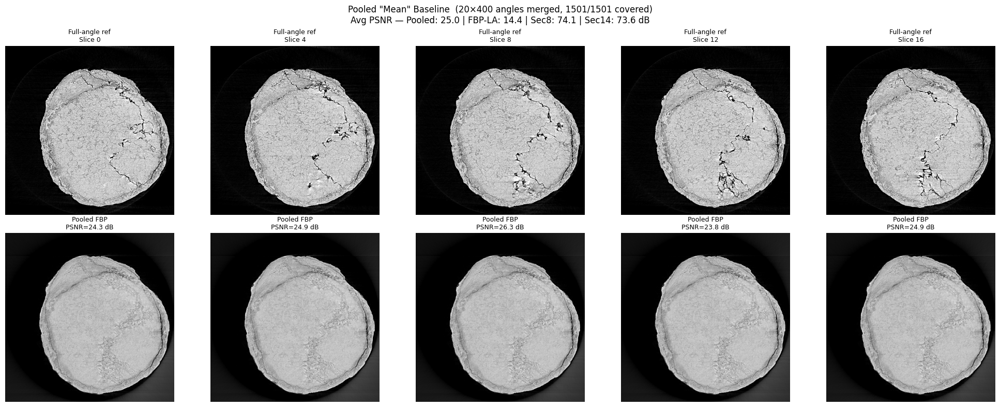

In [143]:
# ── Pool all limited-angle measurements into a single sinogram ─────────────
# Each slice contributes its K_ANGLES rows at its own angle positions.
# Overlapping angles (if any) are averaged; gaps remain zero.
pooled_sino = torch.zeros(V_total, la_data.W, device=device)
pooled_count = torch.zeros(V_total, 1, device=device)

for t in range(N_SLICES):
    idx_t = la_data.slice_angle_indices[t]
    pooled_sino[idx_t] += la_data.limited_sinograms[t].to(device)
    pooled_count[idx_t] += 1

filled = pooled_count.squeeze() > 0
pooled_sino[filled] /= pooled_count[filled]

n_covered = int(filled.sum().item())
print(f"Pooled sinogram: {V_total} angles total, {n_covered} covered "
      f"({100*n_covered/V_total:.1f}%), {V_total - n_covered} zero-filled")

# ── FBP reconstruction from pooled sinogram ───────────────────────────────
pooled_recon = fbp_reconstruction_masked(
    projs_vrc=pooled_sino.unsqueeze(1),   # (V_total, 1, W)
    angles_deg=la_data.all_angles_deg,
    lamino_angle_deg=LAMINO_ANGLE_DEG,
    vol_shape=vol_shape_3d,
    det_spacing_mm=DET_SPACING_MM,
    filter_type='hann',
    device=device,
)[0].cpu()  # (ny, nx)

# ── Metrics against every slice ────────────────────────────────────────────
pooled_psnrs = [compute_psnr_np(pooled_recon.numpy(), full_recons[i].numpy()) for i in range(N_SLICES)]
pooled_ssims = [compute_ssim_np(pooled_recon.numpy(), full_recons[i].numpy()) for i in range(N_SLICES)]

# ── Comparison table ───────────────────────────────────────────────────────
print(f"\n{'Slice':>6}  {'Pooled FBP':>11}  {'FBP-LA':>8}  {'Sec8 GSplat':>12}  {'Sec14 GSplat':>13}")
print("-" * 60)
for i in range(N_SLICES):
    print(f"{i:>6d}  {pooled_psnrs[i]:>11.2f}  {la_fbp_psnrs[i]:>8.2f}  "
          f"{gsplat_psnrs[i]:>12.2f}  {gsplat_psnrs_v2[i]:>13.2f}")
print("-" * 60)
print(f"{'AVG':>6}  {np.mean(pooled_psnrs):>11.2f}  {avg_la:>8.2f}  "
      f"{avg_s8:>12.2f}  {avg_s14:>13.2f}")

# ── Visual ─────────────────────────────────────────────────────────────────
n_show = min(5, N_SLICES)
fig, axes = plt.subplots(2, n_show, figsize=(4*n_show, 8))
for j in range(n_show):
    idx = j * (N_SLICES // n_show)
    ref = full_recons[idx].numpy()
    vmin, vmax = np.percentile(ref, [2, 98])
    axes[0, j].imshow(ref, cmap='gray', vmin=vmin, vmax=vmax)
    axes[0, j].set_title(f'Full-angle ref\nSlice {idx}', fontsize=9); axes[0, j].axis('off')
    axes[1, j].imshow(pooled_recon.numpy(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[1, j].set_title(f'Pooled FBP\nPSNR={pooled_psnrs[idx]:.1f} dB', fontsize=9); axes[1, j].axis('off')

plt.suptitle(
    f'Pooled "Mean" Baseline  ({N_SLICES}×{K_ANGLES} angles merged, {n_covered}/{V_total} covered)\n'
    f'Avg PSNR — Pooled: {np.mean(pooled_psnrs):.1f} | FBP-LA: {avg_la:.1f} | '
    f'Sec8: {avg_s8:.1f} | Sec14: {avg_s14:.1f} dB',
    fontsize=12,
)
plt.tight_layout(); plt.show()

Angle step:         0.1199°/proj
Degrees per slice:  47.97°  (400 projections)
Window size:        n_win = 4 slices  (centred ±2 around each frame)
Min angle coverage across frames: 1105/1501 (73.6%)

 Slice    SW-FBP    FBP-LA    Pooled      Sec8     Sec14    SW SSIM
------------------------------------------------------------------
     0     20.63     13.91     24.30     27.43     26.60     0.2290
     1     22.68     14.09     24.92     28.05     27.07     0.3036
     2     26.64     15.08     25.32     27.88     27.11     0.4631
     3     25.93     14.31     24.51     27.14     26.24     0.4457
     4     26.31     13.58     24.90     27.47     26.63     0.4506
     5     26.33     14.58     25.26     27.43     26.86     0.4548
     6     25.56     14.32     24.61     26.68     26.18     0.4417
     7     26.29     14.91     25.14     27.35     26.87     0.4673
     8     27.45     14.72     26.25     28.20     27.79     0.4947
     9     26.74     15.45     25.94     27.65     2

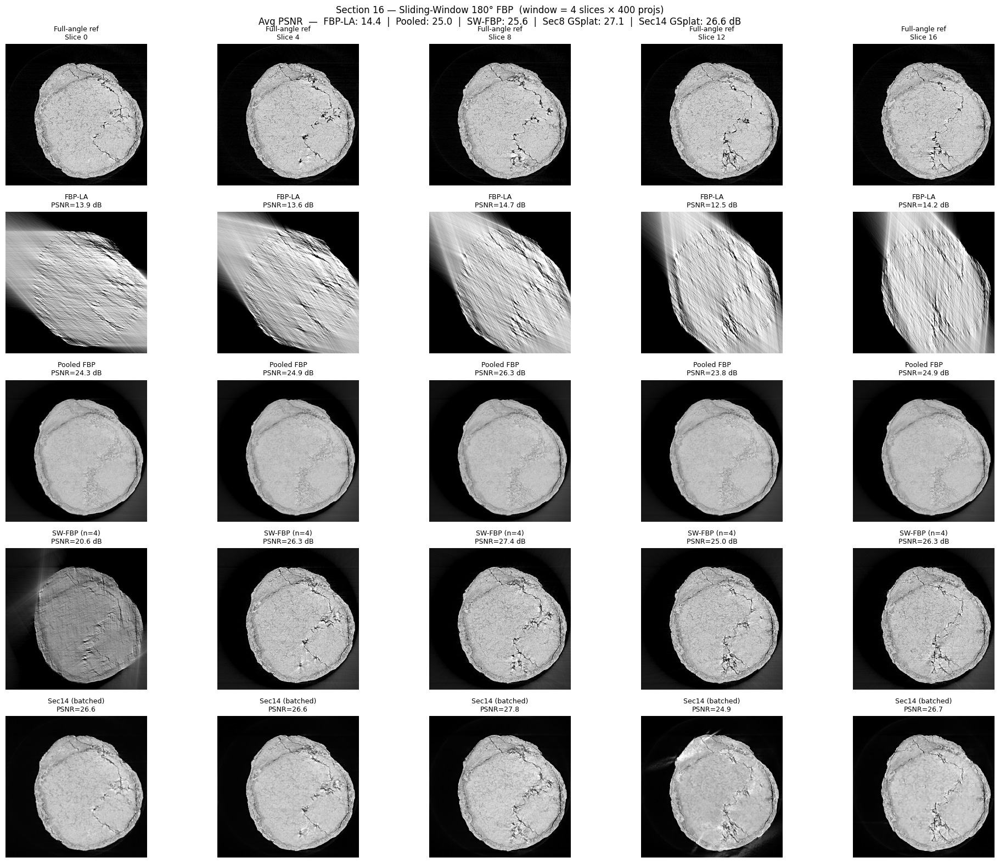

In [167]:
# ══════════════════════════════════════════════════════════════════════════
# Section 16. Improved Baseline: Sliding-Window 180° FBP
# ──────────────────────────────────────────────────────────────────────────
# Each slice holds K_ANGLES consecutive projections that span only
# ~(K_ANGLES/N_proj * 180°) degrees — far less than 180°.
# For each frame t, we collect the minimum number of temporally-adjacent
# slices (a sliding window) whose union of angle indices covers ≥180°,
# then reconstruct with FBP. Same number of output frames as GSplat.
# ══════════════════════════════════════════════════════════════════════════
import math as _math

# ── Determine minimum window size for ≥180° coverage ─────────────────────
angle_step_deg     = float(la_data.all_angles_deg[1] - la_data.all_angles_deg[0])
angle_per_slice_deg = K_ANGLES * angle_step_deg        # degrees per individual slice
n_win = _math.ceil(180.0 / angle_per_slice_deg)        # initial estimate

# Verify: grow window until the union covers ≥98% of V_total angles
for extra in range(5):
    test_idx = set()
    for k in range(n_win + extra):
        test_idx.update(la_data.slice_angle_indices[k % N_SLICES].tolist())
    if len(test_idx) >= int(0.98 * V_total):
        n_win = n_win + extra
        break

half = n_win // 2
print(f"Angle step:         {angle_step_deg:.4f}°/proj")
print(f"Degrees per slice:  {angle_per_slice_deg:.2f}°  ({K_ANGLES} projections)")
print(f"Window size:        n_win = {n_win} slices  "
      f"(centred ±{half} around each frame)")

# Quick per-frame coverage check
min_cov = V_total
for t in range(N_SLICES):
    win     = [(t - half + k) % N_SLICES for k in range(n_win)]
    covered = len(set().union(*[set(la_data.slice_angle_indices[tw].tolist()) for tw in win]))
    min_cov = min(min_cov, covered)
print(f"Min angle coverage across frames: {min_cov}/{V_total} ({100*min_cov/V_total:.1f}%)")

# ── Sliding-window FBP (one reconstruction per frame) ─────────────────────
sw_fbp_recons = []
sw_fbp_psnrs  = []
sw_fbp_ssims  = []

for t in range(N_SLICES):
    sw_sino  = torch.zeros(V_total, la_data.W)
    sw_count = torch.zeros(V_total, 1)

    for tw in [(t - half + k) % N_SLICES for k in range(n_win)]:
        ang_idx = la_data.slice_angle_indices[tw]        # (K_ANGLES,)
        sw_sino[ang_idx]  += la_data.limited_sinograms[tw]
        sw_count[ang_idx] += 1.0

    # Average where multiple slices contributed the same angle
    filled_sw = sw_count.squeeze() > 0
    sw_sino[filled_sw] /= sw_count[filled_sw]

    recon_sw = fbp_reconstruction_masked(
        projs_vrc=sw_sino.to(device).unsqueeze(1),      # (V_total, 1, W)
        angles_deg=la_data.all_angles_deg,
        lamino_angle_deg=LAMINO_ANGLE_DEG,
        vol_shape=vol_shape_3d,
        det_spacing_mm=DET_SPACING_MM,
        filter_type='hann',
        device=device,
    )[0].cpu()

    ref_t  = full_recons[t].numpy()
    rec_np = recon_sw.numpy()
    sw_fbp_recons.append(recon_sw)
    sw_fbp_psnrs.append(compute_psnr_np(rec_np, ref_t))
    sw_fbp_ssims.append(compute_ssim_np(rec_np, ref_t))

sw_fbp_recons = torch.stack(sw_fbp_recons, dim=0)
avg_sw = float(np.mean(sw_fbp_psnrs))

# ── Summary table ─────────────────────────────────────────────────────────
print(f"\n{'Slice':>6}  {'SW-FBP':>8}  {'FBP-LA':>8}  {'Pooled':>8}  "
      f"{'Sec8':>8}  {'Sec14':>8}  {'SW SSIM':>9}")
print("-" * 66)
for i in range(N_SLICES):
    print(f"{i:>6d}  {sw_fbp_psnrs[i]:>8.2f}  {la_fbp_psnrs[i]:>8.2f}  "
          f"{pooled_psnrs[i]:>8.2f}  {gsplat_psnrs[i]:>8.2f}  "
          f"{gsplat_psnrs_v2[i]:>8.2f}  {sw_fbp_ssims[i]:>9.4f}")
print("-" * 66)
print(f"{'AVG':>6}  {avg_sw:>8.2f}  {avg_la:>8.2f}  {np.mean(pooled_psnrs):>8.2f}  "
      f"{avg_s8:>8.2f}  {avg_s14:>8.2f}  {np.mean(sw_fbp_ssims):>9.4f}")
print()
print(f"  Δ(SW-FBP − FBP-LA)  = {avg_sw - avg_la:+.2f} dB")
print(f"  Δ(SW-FBP − Pooled)  = {avg_sw - np.mean(pooled_psnrs):+.2f} dB")
print(f"  Δ(Sec8    − SW-FBP) = {avg_s8  - avg_sw:+.2f} dB  ← GSplat gain over improved baseline")
print(f"  Δ(Sec14   − SW-FBP) = {avg_s14 - avg_sw:+.2f} dB")

# ── Visual comparison: ref / FBP-LA / Pooled / SW-FBP ─────────────────────
n_show = min(5, N_SLICES)
fig, axes = plt.subplots(5, n_show, figsize=(4 * n_show, 16))

for j in range(n_show):
    idx  = j * (N_SLICES // n_show) if n_show < N_SLICES else j
    ref  = full_recons[idx].numpy()
    vmin, vmax = np.percentile(ref, [2, 98])

    axes[0, j].imshow(ref, cmap='gray', vmin=vmin, vmax=vmax)
    axes[0, j].set_title(f'Full-angle ref\nSlice {idx}', fontsize=9)
    axes[0, j].axis('off')

    axes[1, j].imshow(la_fbp_recons[idx].numpy(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[1, j].set_title(f'FBP-LA\nPSNR={la_fbp_psnrs[idx]:.1f} dB', fontsize=9)
    axes[1, j].axis('off')

    axes[2, j].imshow(pooled_recon.numpy(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[2, j].set_title(f'Pooled FBP\nPSNR={pooled_psnrs[idx]:.1f} dB', fontsize=9)
    axes[2, j].axis('off')

    axes[3, j].imshow(sw_fbp_recons[idx].numpy(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[3, j].set_title(f'SW-FBP (n={n_win})\nPSNR={sw_fbp_psnrs[idx]:.1f} dB', fontsize=9)
    axes[3, j].axis('off')

    # Row 4: Section 14 (batched)
    gs14 = gsplat_recons_v2[idx].numpy()
    axes[4, j].imshow(gs14, cmap='gray', vmin=vmin, vmax=vmax)
    axes[4, j].set_title(f'Sec14 (batched)\nPSNR={gsplat_psnrs_v2[idx]:.1f}', fontsize=9)
    axes[4, j].axis('off')

plt.suptitle(
    f'Section 16 — Sliding-Window 180° FBP  (window = {n_win} slices × {K_ANGLES} projs)\n'
    f'Avg PSNR  —  FBP-LA: {avg_la:.1f}  |  Pooled: {np.mean(pooled_psnrs):.1f}  |  '
    f'SW-FBP: {avg_sw:.1f}  |  Sec8 GSplat: {avg_s8:.1f}  |  Sec14 GSplat: {avg_s14:.1f} dB',
    fontsize=12,
)
plt.tight_layout()
plt.show()